# **Introduction**

<span style="font-size:16px;white-space: pre-line">L'objectif du notebook est la création d'un modèle de classification d'image à l'aide d'une TPU (Tensor processing Unit) pour identifier les fleurs de 104 differentes éspéces. On explore les performances de plusieurs modèles convolutionnels et le potentiel du Vision Transformer et de la technique d'ensemble..<span>
<span style="font-size:16px;white-space: pre-line">Sources:<span>

<span style="font-size:16px;white-space: pre-line">https://medium.com/swlh/understanding-inception-simplifying-the-network-architecture-54cd31d38949<span>
<span style="font-size:16px;white-space: pre-line">https://towardsdatascience.com/review-xception-with-depthwise-separable-convolution-better-than-inception-v3-image-dc967dd42568<span>
<span style="font-size:16px;white-space: pre-line">https://medium.com/machine-intelligence-and-deep-learning-lab/vit-vision-transformer-cc56c8071a20#:~:text=The%20Multi%2DHead%20Attention%20in,are%20semantically%20relevant%20for%20classification.><span>
<span style="font-size:16px;white-space: pre-line">https://heartbeat.comet.ml/reviewing-efficientnet-increasing-the-accuracy-and-robustness-of-cnns-6aaf411fc81d<span>
<span style="font-size:16px;white-space: pre-line">https://www.kaggle.com/docs/tpu<span>
<span style="font-size:16px;white-space: pre-line"> https://www.kaggle.com/code/ryanholbrook/create-your-first-submission/notebook<span>
<span style="font-size:16px;white-space: pre-line">https://www.kaggle.com/code/mgornergoogle/efficientnetb7-on-100-flowers/notebook<span>    
<span style="font-size:16px;white-space: pre-line">https://www.kaggle.com/code/wrrosa/tpu-enet-b7-densenet/notebook<span>   
    
    
<span style="font-size:16px;white-space: pre-line">Github:><span>
    <span style="font-size:16px;white-space: pre-line">https://github.com/FrancescoFran/Projet8---Petals-to-the-metal-competition.git<span>
    

In [2]:
pip install --quiet vit-keras

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install -U -q efficientnet

Note: you may need to restart the kernel to use updated packages.


In [4]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import warnings
import re
import math
import random
import tensorflow_addons as tfa
import timeit
import tensorflow as tf
import tensorflow.keras.backend as K
import tensorflow_hub as hub
import warnings
from vit_keras import vit
import os
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold
from sklearn.utils import class_weight
from matplotlib import pyplot as plt

from sklearn.metrics import f1_score, precision_score, recall_score,\
    confusion_matrix

from tensorflow.data import Iterator
from kaggle_datasets import KaggleDatasets
print('Tensorflow version ' + tf.__version__)


for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
warnings.filterwarnings("ignore")

2023-02-15 06:43:11.898609: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/conda/lib
2023-02-15 06:43:11.898753: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Tensorflow version 2.4.1
/kaggle/input/ens-xception-vit/submission.csv
/kaggle/input/ens-xception-vit/score_Xception_ViT_df.csv
/kaggle/input/ens-xception-vit/__results___files/__results___50_1.png
/kaggle/input/ens-xception-vit/__results___files/__results___38_1.png
/kaggle/input/ens-xception-vit/__results___files/__results___100_0.png
/kaggle/input/ens-xception-vit/__results___files/__results___113_2.png
/kaggle/input/ens-xception-vit/__results___files/__results___26_1.png
/kaggle/input/ens-xception-vit/__results___files/__results___106_3.png
/kaggle/input/ens-xception-vit/__results___files/__results___59_0.png
/kaggle/input/ens-xception-vit/__results___files/__results___116_1.png
/kaggle/input/ens-xception-vit/__results___files/__results___65_1.png
/kaggle/input/ens-xception-vit/__results___files/__results___103_2.png
/kaggle/input/ens-xception-vit/__results___files/__results___44_0.png
/kaggle/input/ens-xception-vit/__results___files/__results___68_2.png
/kaggle/input/ens-xception-

# **Detect accelerator**

<span style="font-size:16px;">Une TPU est utilisée pour l'entrainement des modèles. Les TPU sont des accélérateurs connectés au réseau spécialisés dans les tâches deep learning et la première étape est de les localiser sur le réseau. C’est ce que fait TPUClusterResolver.connect(). Ensuite TPUStrategy doit être instanciée. TPUStrategy est un objet contenant le code d'entrainement distribué qui fonctionnera sur les TPU avec leurs 8 cores de calcul.<span>

<img src="https://i.imgur.com/M7aKVZU.png" width="600px"/>

<span style="font-size:16px;">Chaque core TPU possède une VPU (Vector Processing Unit) traditionnelle 
 ainsi que une partie HW dédiée à la multiplication de matrices capable de traiter des matrices 128x128. C’est la partie qui accélère spécifiquement le procès d'entrainement des modèles. Enfin, TPUStrategy est utilisé en instanciant le modèle dans le cadre de la stratégie. Cela crée le modèle sur le TPU et Tensorflow distribuera l'entrainement entre les huit TPU cores en créant huit répliques différentes du modèle, une pour chaque core.<span>

In [5]:
# Détecte l'HW, retourne la stratégie de distribution appropriée
try:
    # connecte à une TPU et instancie une stratégie de distribution
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    # détection TPU.
    # Aucun paramètre nécessaire si la variable d’environnement TPU_NAME est définie
    # Pour Kaggle c'est toujours le cas.
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    # stratégie de distribution par défaut dans Tensorflow. Fonctionne sur CPU et GPU unique.
    strategy = tf.distribute.get_strategy()

print("REPLICAS: ", strategy.num_replicas_in_sync)

Running on TPU  grpc://10.0.0.2:8470


2023-02-15 06:43:25.794452: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-02-15 06:43:25.797621: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/conda/lib
2023-02-15 06:43:25.797667: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2023-02-15 06:43:25.797693: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (6d60deb916ee): /proc/driver/nvidia/version does not exist
2023-02-15 06:43:25.801446: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operation

REPLICAS:  8


# **Chargement des données**

## **Chemin des données**

<span style="font-size:16px;">Lorsqu’ils sont utilisés avec des TPU, les jeux de données doivent être stockés dans un Google Cloud Storage bucket. Il est possible d’utiliser les données de n’importe quel CGS bucket en donnant son chemin. Les TPUs ont huit cores qui agissent de façon independante. On peut envoyer des données à chaque core plus efficacement en divisant l’ensemble de données en plusieurs fichiers or shards. Le type de fichier le plus pratique à utiliser pour le partage dans TensorFlow est un TFRecord. Un TFRecord est un fichier binaire qui contient des séquences de byte-strings. Les données doivent être sérialisées (encodées sous forme de byte-strings) avant d’être écrites dans un TFRecord. Les TPU sont équipés de 128 Go de mémoire haute vitesse permettant de plus grands batches, de plus grands modèles et aussi de plus grandes taille de données. On peut facilement gérer donc les images de taille 512x512 px fournies dans le jeu de données (dimensions d’image disponibles: 192, 224, 331, 512).<span>

In [6]:
IMAGE_SIZE = [512, 512]
# Data access
GCS_DS_PATH = KaggleDatasets().get_gcs_path('tpu-getting-started')
# num_parallel_reads=AUTO instruit l'API
# à lire de plusieurs fichiers si disponibles.
# Il calcule le nombre de fichiers automatiquement.
AUTO = tf.data.experimental.AUTOTUNE


GCS_PATH_SELECT = {  # taille d'images disponibles
    192: GCS_DS_PATH + '/tfrecords-jpeg-192x192',
    224: GCS_DS_PATH + '/tfrecords-jpeg-224x224',
    331: GCS_DS_PATH + '/tfrecords-jpeg-331x331',
    512: GCS_DS_PATH + '/tfrecords-jpeg-512x512'
}
GCS_PATH = GCS_PATH_SELECT[IMAGE_SIZE[0]]


# list des files de training dans GCS
TRAINING_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/train/*.tfrec')
# list des files de validation dans GCS
VALIDATION_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/val/*.tfrec')
# list des files de test files dans GCS
TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/test/*.tfrec')

print(TRAINING_FILENAMES)

['gs://kds-72834e566f36cd37b9c46fc8352ad7a0bc6798e4ed3d1cc793e5818d/tfrecords-jpeg-512x512/train/00-512x512-798.tfrec', 'gs://kds-72834e566f36cd37b9c46fc8352ad7a0bc6798e4ed3d1cc793e5818d/tfrecords-jpeg-512x512/train/01-512x512-798.tfrec', 'gs://kds-72834e566f36cd37b9c46fc8352ad7a0bc6798e4ed3d1cc793e5818d/tfrecords-jpeg-512x512/train/02-512x512-798.tfrec', 'gs://kds-72834e566f36cd37b9c46fc8352ad7a0bc6798e4ed3d1cc793e5818d/tfrecords-jpeg-512x512/train/03-512x512-798.tfrec', 'gs://kds-72834e566f36cd37b9c46fc8352ad7a0bc6798e4ed3d1cc793e5818d/tfrecords-jpeg-512x512/train/04-512x512-798.tfrec', 'gs://kds-72834e566f36cd37b9c46fc8352ad7a0bc6798e4ed3d1cc793e5818d/tfrecords-jpeg-512x512/train/05-512x512-798.tfrec', 'gs://kds-72834e566f36cd37b9c46fc8352ad7a0bc6798e4ed3d1cc793e5818d/tfrecords-jpeg-512x512/train/06-512x512-798.tfrec', 'gs://kds-72834e566f36cd37b9c46fc8352ad7a0bc6798e4ed3d1cc793e5818d/tfrecords-jpeg-512x512/train/07-512x512-798.tfrec', 'gs://kds-72834e566f36cd37b9c46fc8352ad7a0bc679

2023-02-15 06:43:34.811210: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
2023-02-15 06:43:34.863067: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
2023-02-15 06:43:34.900217: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.


## **Import du jeu de données**

<span style="font-size:16px;">On définit des fonctions pour lire tfrecords et charger le jeu de données. Ensuite, on définit les noms des classes (104) et on crée des fonctions pour charger le jeu de données de training, le jeu de données de validation et le jeu de données de test. On définit également la taille du batch. Pour aller vite sur une TPU, la taille du batch doit être augmentée. La règle de base est d’utiliser des batches de 128 éléments par core (ex : taille de batch de 128*8=1024 pour une TPU de 8 cores). À cette taille, le potentiel de l'HW des multiplicateurs de matrices 128x128 du TPU est bien exploité.<span>

In [7]:
def decode_image(image_data):
    image = tf.image.decode_jpeg(image_data, channels=3)
    # converte image en floats dans la plage [0, 1]
    image = tf.cast(image, tf.float32) / 255.0
    # taille explicite demandée par le TPU
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image


def read_labeled_tfrecord(example):
    LABELED_TFREC_FORMAT = {
        # tf.string signifie bytestring
        "image": tf.io.FixedLenFeature([], tf.string),
        # shape [] signifie single element
        "class": tf.io.FixedLenFeature([], tf.int64),
    }
    example = tf.io.parse_single_example(example, LABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    label = tf.cast(example['class'], tf.int32)
    return image, label  # returns a dataset of (image, label) pairs


def read_unlabeled_tfrecord(example):
    UNLABELED_TFREC_FORMAT = {
        # tf.string signifie bytestring
        "image": tf.io.FixedLenFeature([], tf.string),
        # shape [] signifie single element
        "id": tf.io.FixedLenFeature([], tf.string),
        # pas de classe pour le jeu de test,
        # car la competition consiste à predire les classes des fleurs
        # pour le jeu de test
    }
    example = tf.io.parse_single_example(example, UNLABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    idnum = example['id']
    return image, idnum  # returns a dataset of image(s)


def load_dataset(filenames, labeled=True, ordered=False):
    # Lire depuis TFRecords. Pour des performances optimales,
    # on lit depuis plusieurs fichiers à la fois
    # et on respecte pas l'ordre.
    # L’ordre n’a pas d’importance puisque nous allons appliquer le shuffling aux données
    ignore_order = tf.data.Options()
    if not ordered:
        # désactiver l’ordre, augmenter la vitesse
        ignore_order.experimental_deterministic = False

    # lecture entrelacée à partir de plusieurs fichiers
    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO)
    # on utilise les données dès qu’elles sont entrées, plutôt que dans leur ordre initial
    dataset = dataset.with_options(ignore_order)
    dataset = dataset.map(read_labeled_tfrecord if labeled
                          else read_unlabeled_tfrecord,
                          num_parallel_calls=AUTO)
    # on obtien un jeu de données de paires (image, label)
    # si labeled=True ou (image, id) paires si labeled=False
    return dataset


CLASSES = [
    'pink primrose',     'hard-leaved pocket orchid', 'canterbury bells',
    'sweet pea',         'wild geranium',             'tiger lily',
    'moon orchid',       'bird of paradise',          'monkshood',
    'globe thistle',     'snapdragon',                "colt's foot",
    'king protea',       'spear thistle',             'yellow iris',
    'globe-flower',      'purple coneflower',         'peruvian lily',
    'balloon flower',    'giant white arum lily',     'fire lily',
    'pincushion flower', 'fritillary',                'red ginger',
    'grape hyacinth',    'corn poppy',              'prince of wales feathers',
    'stemless gentian',  'artichoke',                 'sweet william',
    'carnation',         'garden phlox',              'love in the mist',
    'cosmos',            'alpine sea holly',          'ruby-lipped cattleya',
    'cape flower',       'great masterwort',          'siam tulip',
    'lenten rose',       'barberton daisy',           'daffodil',
    'sword lily',        'poinsettia',                'bolero deep blue',
    'wallflower',        'marigold',                  'buttercup',
    'daisy',             'common dandelion',          'petunia',
    'wild pansy',        'primula',                   'sunflower',
    'lilac hibiscus',    'bishop of llandaff',        'gaura',
    'geranium',          'orange dahlia',             'pink-yellow dahlia',
    'cautleya spicata',  'japanese anemone',          'black-eyed susan',
    'silverbush',        'californian poppy',         'osteospermum',
    'spring crocus',     'iris',                      'windflower',
    'tree poppy',        'gazania',                   'azalea',
    'water lily',        'rose',                      'thorn apple',
    'morning glory',     'passion flower',            'lotus',
    'toad lily',         'anthurium',                 'frangipani',
    'clematis',          'hibiscus',                  'columbine',
    'desert-rose',       'tree mallow',               'magnolia',
    'cyclamen ',         'watercress',                'canna lily',
    'hippeastrum ',      'bee balm',                  'pink quill',
    'foxglove',          'bougainvillea',             'camellia',
    'mallow',            'mexican petunia',           'bromelia',
    'blanket flower',    'trumpet creeper',           'blackberry lily',
    'common tulip',      'wild rose']


def get_training_dataset(filenames, augmentation=False):
    dataset = load_dataset(filenames, labeled=True)
    if augmentation:
        # map la fonction data_augment pour les images du jeu de connées
        dataset = dataset.map(data_augment,
                              num_parallel_calls=AUTO).concatenate(dataset)
    # le jeu de training est appelé pendant plusieurs epochs
    dataset = dataset.repeat()
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    # prefetch du prochain batch pendant l'entrainement (autotune prefetch buffer size)
    dataset = dataset.prefetch(AUTO)
    return dataset


def get_validation_dataset(ordered=False):
    dataset = load_dataset(VALIDATION_FILENAMES, labeled=True, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.cache()
    dataset = dataset.prefetch(AUTO)
    return dataset


def get_test_dataset(filenames,ordered=False):
    dataset = load_dataset(filenames, labeled=False, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO)
    return dataset


def count_data_items(filenames):
    # le nombre d’éléments de données est écrit dans le nom des fichiers . tfrec,
    # i.e. flowers00-230.tfrec = 230 éléments
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1))
         for filename in filenames]
    return np.sum(n)


NUM_TRAINING_IMAGES = int(count_data_items(TRAINING_FILENAMES))
NUM_VALIDATION_IMAGES = int(count_data_items(VALIDATION_FILENAMES))
NUM_TEST_IMAGES = int(count_data_items(TEST_FILENAMES))

# On définit la dimension du batch aui sera 16 avec TPU off
# and 128 (=16*8) avec TPU on
BATCH_SIZE = 16 * strategy.num_replicas_in_sync

print('Dataset: {} training images, {} validation images, \
{} test images'.format(NUM_TRAINING_IMAGES, NUM_VALIDATION_IMAGES,
                             NUM_TEST_IMAGES))

Dataset: 12753 training images, 3712 validation images, 7382 test images


<span style="font-size:16px;">Un jeu de données dans TensorFlow est un flux data records. Les jeu de training et de validation sont des flux de paires (image, étiquette). Le jeu de test est un flux de paires (image, idnum).<span>

In [8]:
np.set_printoptions(threshold=15, linewidth=80)
training_dataset = get_training_dataset(TRAINING_FILENAMES)
validation_dataset = get_validation_dataset()
test_dataset = get_test_dataset(TEST_FILENAMES)

print("\nTraining data shapes:")
for image, label in training_dataset.take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Training data label examples:", label.numpy())
print("\nValidation data shapes:")
for image, label in validation_dataset.take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Validation data label examples:", label.numpy())
print("\nTest data shapes:")
for image, idnum in test_dataset.take(3):
    print(image.numpy().shape, idnum.numpy().shape)
print("Test data IDs:", idnum.numpy().astype('U'))  # U=unicode string


Training data shapes:
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
Training data label examples: [73 93 72 ... 13 19 49]

Validation data shapes:


2023-02-15 06:44:10.805216: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 60, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1676443450.801780951","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 60, Output num: 0","grpc_status":3}


(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
Validation data label examples: [103  79  80 ... 103  48 103]

Test data shapes:
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
Test data IDs: ['b87e16bc0' 'd8437a7f7' '981396649' ... '15cb0c24a' '1c3a7bc99' 'b20b97998']


# **Analyse exploratoire des données**

<span style="font-size:16px;">On réalise une analyse exploratoire des données afin de visualiser la distribution des images par classe.<span>


In [9]:
train_dataset = get_training_dataset(TRAINING_FILENAMES, augmentation=False)
validation_dataset = get_validation_dataset()
train_labels_ds = train_dataset.map(lambda image, label: label).unbatch()
validation_labels_ds = validation_dataset.map(lambda image,
                                              label: label).unbatch()
train_labels = next(iter(train_labels_ds.batch(NUM_TRAINING_IMAGES))).numpy()
validation_labels = next(iter(
    validation_labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
train_labels_string = [CLASSES[i] for i in train_labels]
validation_labels_string = [CLASSES[i] for i in validation_labels]
print('Number of labels in training dataset:',len(train_labels_string))
print('Number of labels in validation dataset:',len(validation_labels_string))

Number of labels in training dataset: 12753
Number of labels in validation dataset: 3712


In [10]:
labels_df = pd.DataFrame(train_labels_string, columns=['class'])
labels_count_df = pd.DataFrame(
    labels_df.value_counts().sort_values(ascending=False),
    columns=['train_labels_count']).reset_index()

val_labels_df = pd.DataFrame(validation_labels_string,columns=['class'])
val_labels_count_df = pd.DataFrame(
    val_labels_df.value_counts().sort_values(
        ascending  =False), columns=['val_labels_count']).reset_index()

labels_count_df['val_labels_count'] = val_labels_count_df['val_labels_count']
labels_count_df.head()

,class,train_labels_count,val_labels_count
0,iris,785,228
1,wild rose,750,216
2,wild geranium,678,205
3,common dandelion,557,164
4,rose,464,134


Text(0.5, 1.0, 'Distribution of number of images per class')

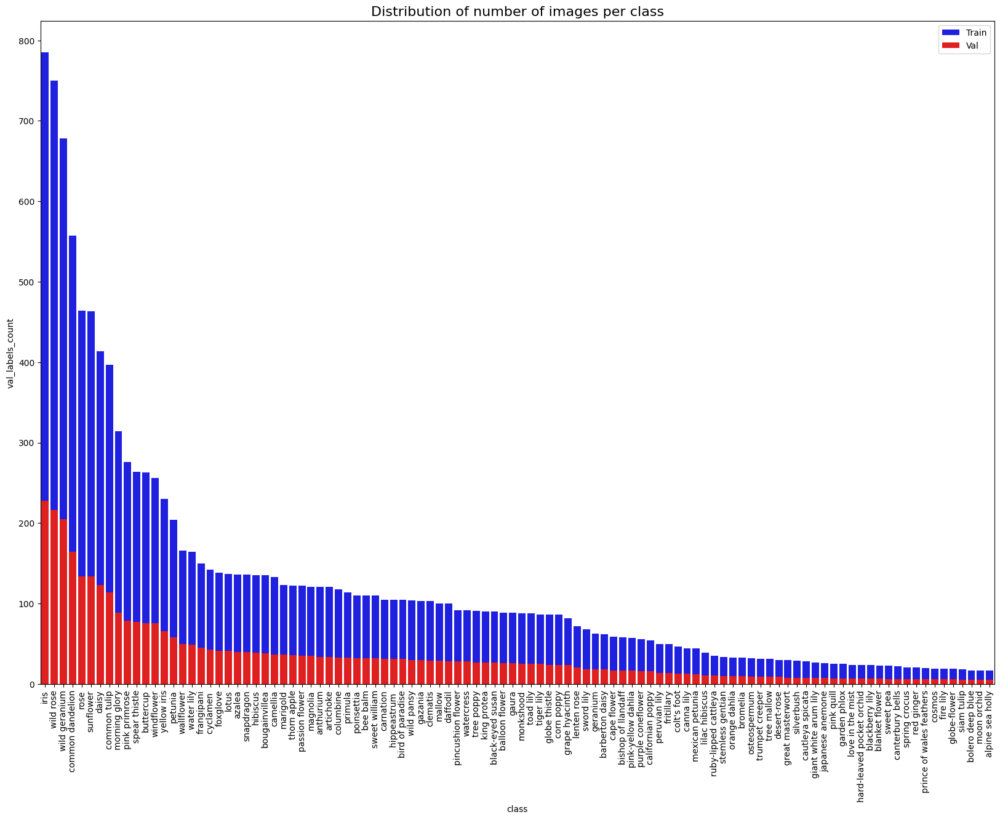

In [11]:
matplotlib.rc_file_defaults()
fig, ax = plt.subplots(figsize=(20, 14))
ax = sns.barplot(x=labels_count_df['class'],
                 y=labels_count_df['train_labels_count'],
                 color='b', label='Train')
ax = sns.barplot(x=val_labels_count_df['class'],
                 y=val_labels_count_df['val_labels_count'],
                 color='r', label='Val')
plt.xticks(rotation='vertical')
plt.legend(loc='upper right')
plt.xlabel('class')
plt.title('Distribution of number of images per class',fontsize=16)

<span style="font-size:16px;white-space: pre-line">Le jeu de données est donc déséquilibré car plusieurs classes ont petites proportions par rapport à d’autres classes. Pour éviter que les modèles aient mauvaises performances par rapport aux classes minoritaire on peut adopter deux techniques: <span>
* <span style="font-size:16px;"> ‘Sampling methods’ qui consistent à créer des nouveaux échantillons pour les classes minoritaires ou supprimer des échantillons des classes majoritaires<span>
* <span style="font-size:16px;"> 2.	‘Cost-sensitive methods’ qui consistent à augmenter le poids des échantillons des classes minoritaires par rapport aux classes majoritaires afin d’obtenir des poids équilibrés par rapport aux nombre relatif d’échantillons entre les classes.<span>

<p style="text-align:center;"><img src="https://i.imgur.com/YdlvfnE.png" width="600px"/><p>

<span style="font-size:16px;"> On adopte la deuxième approche avec l’utilisation de la fonction class_weight de la librairie sklearn.<span>

In [12]:
class_weights = class_weight.compute_class_weight('balanced',
                                                  classes=np.unique(
                                                      train_labels),
                                                  y=train_labels)
dict_weights = dict(enumerate(class_weights))
print(class_weights)
class_weights_labels_string = [CLASSES[i] for i in np.unique(train_labels)]

labels_2_df = pd.DataFrame(class_weights_labels_string, columns=['class'])
labels_2_df['weights'] = class_weights
labels_2_df = labels_2_df.set_index('class').sort_values('weights',
                                                         ascending=False)
labels_2_df = labels_2_df.sort_values('weights', ascending=True)
labels_count_df = labels_count_df.set_index('class')

[0.44429348 4.54166667 6.13125    ... 5.109375   0.30887909 0.1635    ]


In [13]:
labels_count_df['weights'] = labels_2_df['weights']
labels_count_df.head()

,train_labels_count,val_labels_count,weights
class,,,
iris,785,228,0.156210
wild rose,750,216,0.163500
wild geranium,678,205,0.180863
common dandelion,557,164,0.220153
rose,464,134,0.264278


In [14]:
labels_count_df=labels_count_df.reset_index()

Text(0.5, 1.0, 'Distribution of number of images and weights per class')

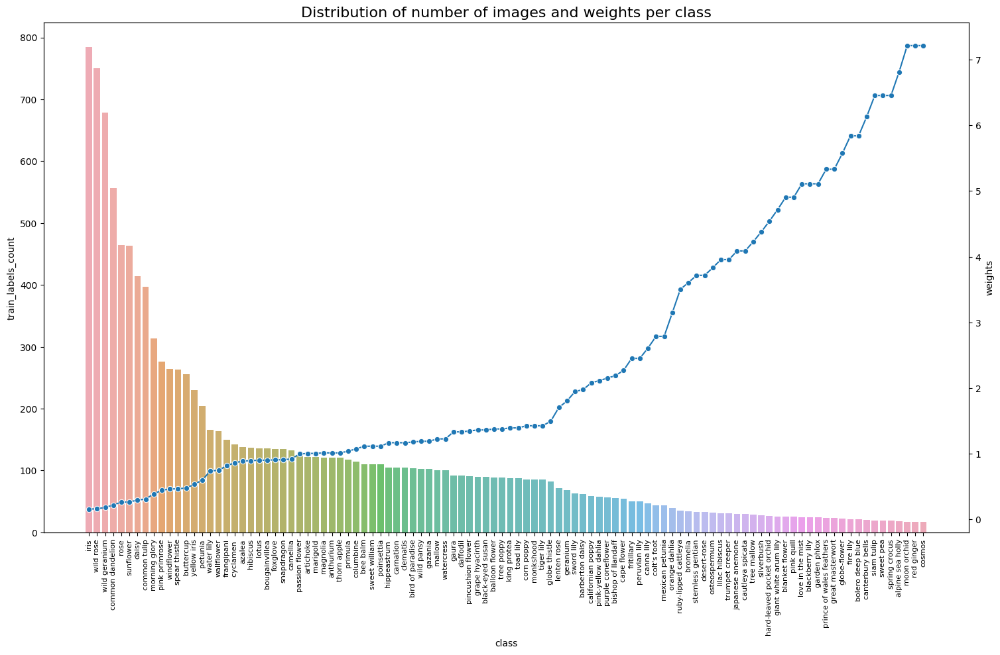

In [15]:
matplotlib.rc_file_defaults()
ax1 = sns.set_style(style=None, rc=None)
fig, ax1 = plt.subplots(figsize=(18, 10))
sns.barplot(data=labels_count_df, x='class', y='train_labels_count', alpha=0.8, ax=ax1)
plt.xticks(rotation='vertical', fontsize=8)
ax2 = ax1.twinx()
sns.lineplot(data=labels_count_df['weights'], marker='o', sort=False, ax=ax2)
plt.title('Distribution of number of images and weights per class',fontsize=16)

# **Examples d'images du jeu de données**

<span style="font-size:16px;white-space: pre-line">On définit des fonctions pour visualiser des images du jeu de données avec leurs étiquettes.<span>

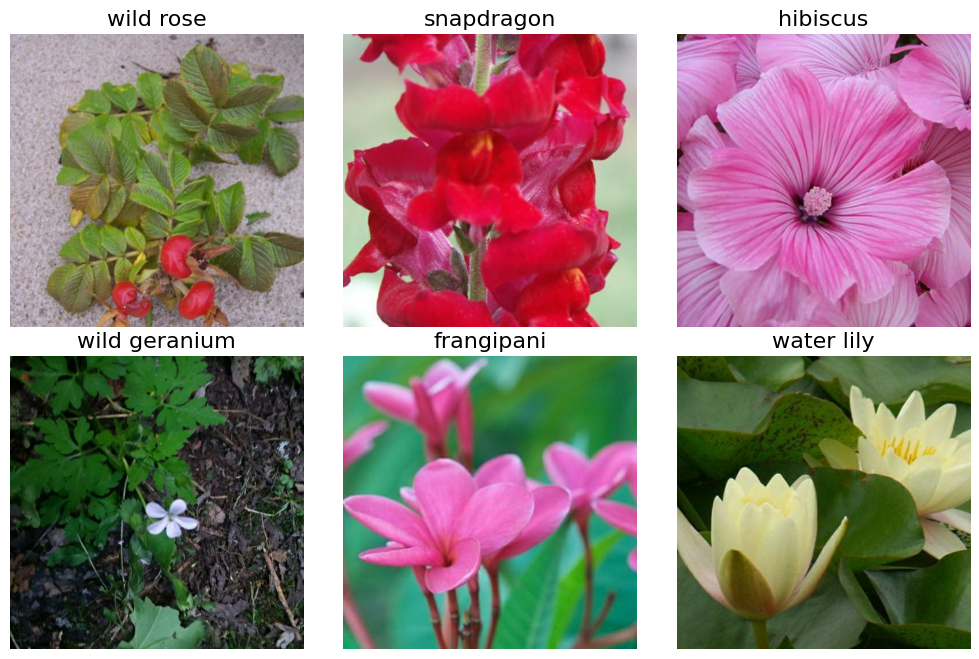

In [16]:
def batch_to_numpy_images_and_labels(data):
    images, labels = data
    numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    # binary string si image ID strings
    if numpy_labels.dtype == object:
        numpy_labels = [None for _ in enumerate(numpy_images)]
        # Si pas d'étiquette, seulement image IDs,
        # return None pour les étiquettes (pour les données de test)
    return numpy_images, numpy_labels


def display_one_flower(image, title, subplot, red=False, titlesize=16):
    plt.subplot(*subplot)
    plt.axis('off')
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize)
                  if not red else int(titlesize/1.2),
                  color='red' if red else 'black',
                  fontdict={'verticalalignment': 'center'},
                  pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)


def title_from_label_and_target(label, correct_label):
    if correct_label is None:
        return CLASSES[label], True
    correct = (label == correct_label)
    return "{} [{}{}{}]".format(CLASSES[label], 'OK' if correct else 'NO', u"\u2192" if not correct else '',
                                CLASSES[correct_label] if not correct else ''), correct

def display_one_flower(image, title, subplot, red=False, titlesize=16):
    plt.subplot(*subplot)
    plt.axis('off')
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize) if not red else int(titlesize/1.2), color='red' if red else 'black', fontdict={'verticalalignment':'center'}, pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)


def display_batch_of_images(databatch, predictions=None,
                            display_mismatches_only=False):
    """Fonction valable pour:
    display_batch_of_images(images)
    display_batch_of_images(images, predictions)
    display_batch_of_images((images, labels))
    display_batch_of_images((images, labels), predictions)
    """
    # données
    images, labels = batch_to_numpy_images_and_labels(databatch)
    if labels is None:
        labels = [None for _ in enumerate(images)]

    # auto-squaring: cela supprime les données qui ne rentrent pas
    # dans le rectangle carré ou carré
    rows = int(math.sqrt(len(images)))
    cols = len(images)//rows

    FIGSIZE = 10.0
    SPACING = 0.1
    subplot = (rows, cols, 1)
    if rows < cols:
        plt.figure(figsize=(FIGSIZE, FIGSIZE/cols*rows))
    else:
        plt.figure(figsize=(FIGSIZE/rows*cols, FIGSIZE))

    # display
    for i, (image, label) in enumerate(zip(images[:rows*cols],
                                           labels[:rows*cols])):
        title = '' if label is None else CLASSES[label]
        correct = True
        if predictions is not None:
            title, correct = title_from_label_and_target(predictions[i],
                                                         label)
        
        dynamic_titlesize = FIGSIZE*SPACING/max(rows, cols)*40+3
        if display_mismatches_only:
            if predictions[i] != label:
                subplot = display_one_flower(image, title, subplot,
                                             not correct,
                                             titlesize=dynamic_titlesize)
        else:
            subplot = display_one_flower(image, title, subplot, not correct,
                                         titlesize=dynamic_titlesize)

    # layout
    plt.tight_layout()
    if label is None and predictions is None:
        plt.subplots_adjust(wspace=0, hspace=0)
    else:
        plt.subplots_adjust(wspace=SPACING, hspace=SPACING)
    plt.show()


# On itère sur les batches du jeu de données
ds_iter = iter(training_dataset.unbatch().batch(6))
# Sélection d'un batch
one_batch = next(ds_iter)
# Visualization du batch
display_batch_of_images(one_batch)

# **Data augmentation**

<span style="font-size:16px;white-space: pre-line">Le processus de data augmentation des données dérive de nouvelles images de celles existantes en appliquant des transformations géométriques aléatoires afin d’incorporer un niveau de variation dans le jeu de training qui permet au modèle de mieux généraliser sur des données inconnues. L’augmentation des données du jeu de training est extrêmement puissante en termes d’augmentation de la précision de réduction de l’overfitting.<span>
  <span style="font-size:16px;white-space: pre-line">Les transformations appliquées au jeu de training sont :<span>
* <span style="font-size:16px;"> Random blockout - sélection au hasard d’une région rectangle dans une image et remplacement de ses pixels par des pixels noirs.<span>
* <span style="font-size:16px;"> Random_flip_left_right - retournement de l’image au hasard horizontalement (de gauche à droite).<span>
* <span style="font-size:16px;"> Random_saturation – ajustement de la saturation de l’images RVB par un facteur aléatoire.<span>
* <span style="font-size:16px;"> Random_contrast - ajustement du contraste de l’images par un facteur aléatoire.<span>
* <span style="font-size:16px;"> Rotation aléatoire - rotation de l’image dans le sens antihoraire par un angle aléatoire.<span>

In [17]:
def random_blockout(img, sl=0.1, sh=0.2, rl=0.4):
    p = np.random.random()
    if p >= 0.25:
        w, h, c = IMAGE_SIZE[0], IMAGE_SIZE[1], 3
        origin_area = tf.cast(h*w, tf.float32)

        e_size_l = tf.cast(tf.round(tf.sqrt(origin_area * sl * rl)), tf.int32)
        e_size_h = tf.cast(tf.round(tf.sqrt(origin_area * sh / rl)), tf.int32)

        e_height_h = tf.minimum(e_size_h, h)
        e_width_h = tf.minimum(e_size_h, w)

        erase_height = tf.random.uniform(shape=[],
                                         minval=e_size_l,
                                         maxval=e_height_h,
                                         dtype=tf.int32)
        erase_width = tf.random.uniform(shape=[],
                                        minval=e_size_l,
                                        maxval=e_width_h,
                                        dtype=tf.int32)

        erase_area = tf.zeros(shape=[erase_height,
                                     erase_width, c])
        erase_area = tf.cast(erase_area, tf.uint8)

        pad_h = h - erase_height
        pad_top = tf.random.uniform(shape=[],
                                    minval=0,
                                    maxval=pad_h,
                                    dtype=tf.int32)
        pad_bottom = pad_h - pad_top

        pad_w = w - erase_width
        pad_left = tf.random.uniform(shape=[], minval=0,
                                     maxval=pad_w, dtype=tf.int32)
        pad_right = pad_w - pad_left

        erase_mask = tf.pad([erase_area], [[0, 0], [pad_top, pad_bottom],
                                           [pad_left, pad_right],
                                           [0, 0]], constant_values=1)
        erase_mask = tf.squeeze(erase_mask, axis=0)
        erased_img = tf.multiply(tf.cast(img, tf.float32),
                                 tf.cast(erase_mask, tf.float32))

        return tf.cast(erased_img, img.dtype)
    else:
        return tf.cast(img, img.dtype)


def data_augment(image, label):

    num = random.randint(1, 5)
    if num == 1:
        augmentation_type = 'random_blockout'
        image = random_blockout(image, sl=0.1, sh=0.2, rl=0.4)
    elif num == 2:
        augmentation_type = 'random_flip_left_right'
        image = tf.image.random_flip_left_right(image)
    elif num == 3:
        augmentation_type = 'random_saturation'
        image = tf.image.random_saturation(image, 1, 3)
    elif num == 4:
        augmentation_type = 'random_contrast'
        image = tf.image.random_contrast(image, 0.4, 0.6)
    elif num == 5:
        augmentation_type = 'image_rotate'
        image = tfa.image.rotate(image, angles=random.randint(1, 359))
    return image, label

training_dataset = get_training_dataset(TRAINING_FILENAMES, augmentation=True)

## **Examples de augmented images**

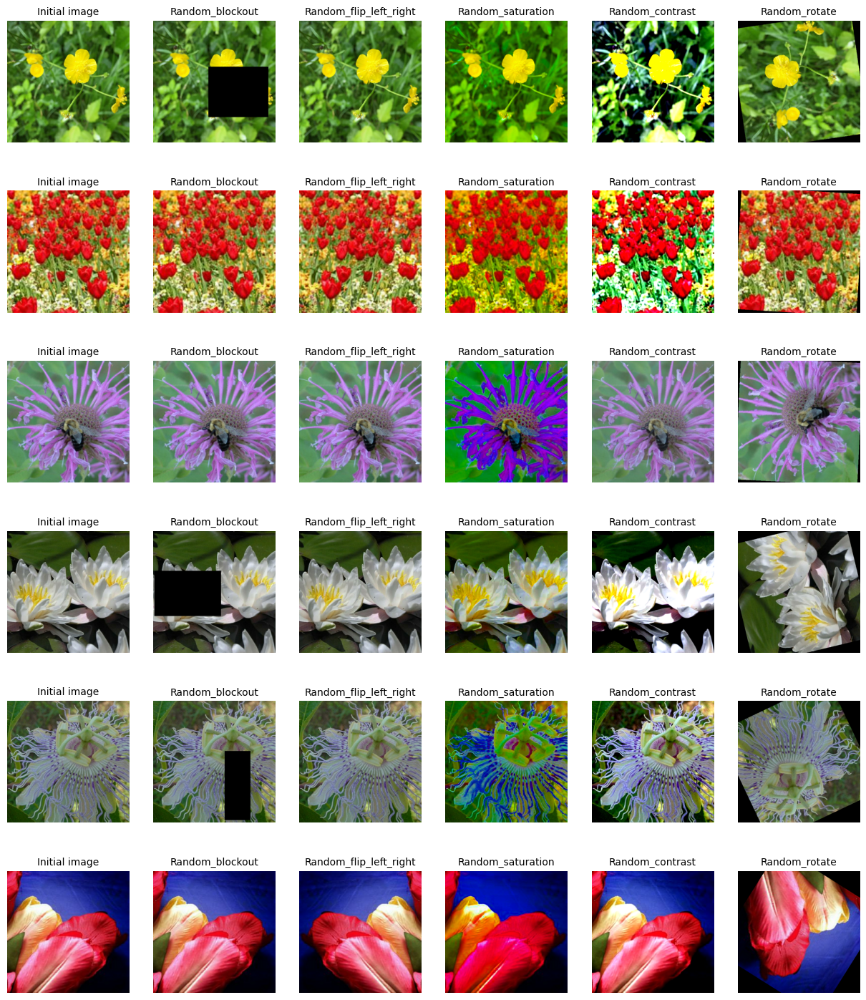

In [18]:
# On itère sur le batch suivant
no_aug_train_set = get_training_dataset(TRAINING_FILENAMES, augmentation=False)
no_aug_train_batch = (next(iter(no_aug_train_set.unbatch().batch(6))))
images, _ = batch_to_numpy_images_and_labels(no_aug_train_batch)

i = 1
row = 6
col = 6
plt.figure(figsize=(18, 18))
fontsize = 10

for image in images:
    plt.subplot(6, col+1, i)
    plt.imshow(image)
    plt.axis('off')
    plt.title('Initial image', fontsize=fontsize)
    plt.subplot(6, col+1, i+1)
    plt.imshow(random_blockout(image, sl=0.1, sh=0.2, rl=0.4))
    plt.axis('off')
    plt.title('Random_blockout', fontsize=fontsize)
    plt.subplot(6, col+1, i+2)
    plt.axis('off')
    plt.title('Initial image', fontsize=fontsize)
    plt.imshow(tf.image.random_flip_left_right(image))
    plt.axis('off')
    plt.title('Random_flip_left_right', fontsize=fontsize)
    plt.subplot(6, col+1, i+3)
    plt.imshow(tf.image.random_saturation(image, 3, 5))
    plt.axis('off')
    plt.title('Random_saturation', fontsize=fontsize)
    plt.subplot(6, col+1, i+4)
    plt.imshow(tf.image.random_contrast(image, 0.8, 3))
    plt.axis('off')
    plt.title('Random_contrast', fontsize=fontsize)
    plt.subplot(6, col+1, i+5)
    plt.imshow(tfa.image.rotate(image, angles=random.randint(0, 364)))
    plt.axis('off')
    plt.title('Random_rotate', fontsize=fontsize)
    i += col+1

# **Modèles de classification et entrainement**

## **Custom Learning Rate scheduler**

<span style="font-size:16px;white-space: pre-line">On définit un Learning Rate schedule pour le Fine Tuning du modèle pre-entrainé avec une rampe LR, car  commencer avec un LR élevé pourrait reduir l'éfficacité des poids du modèle pre-entrainé.<span>

Learning rate schedule: 1e-05 to 5e-05 to 1e-05


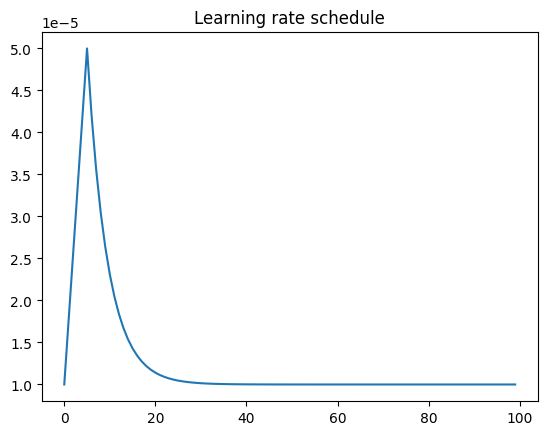

In [19]:
EPOCHS = 100
def exponential_lr(epoch,
                   start_lr = 0.00001, min_lr = 0.00001, max_lr = 0.00005,
                   rampup_epochs = 5, sustain_epochs = 0,
                   exp_decay = 0.8):

    def lr(epoch, start_lr, min_lr, max_lr, rampup_epochs, sustain_epochs, exp_decay):
        # augmentation lineaire de start jusqu'à rampup_epochs
        if epoch < rampup_epochs:
            lr = ((max_lr - start_lr) /
                  rampup_epochs * epoch + start_lr)
        # constante max_lr pendant sustain_epochs
        elif epoch < rampup_epochs + sustain_epochs:
            lr = max_lr
        # réduction éxponentiale jusqu'à min_lr
        else:
            lr = ((max_lr - min_lr) *
                  exp_decay**(epoch - rampup_epochs - sustain_epochs) +
                  min_lr)
        return lr
    return lr(epoch,
              start_lr,
              min_lr,
              max_lr,
              rampup_epochs,
              sustain_epochs,
              exp_decay)

lr_callback = tf.keras.callbacks.LearningRateScheduler(exponential_lr, verbose=True)

rng = [i for i in range(EPOCHS)]
y = [exponential_lr(x) for x in rng]
plt.plot(rng, y)
plt.title('Learning rate schedule')
print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}".format(y[0], max(y), y[-1]))

## **Chargement du modèle et transfer learning**

<span style="font-size:16px;white-space: pre-line">On définit une fonction pour charger des modèles pré-entrainé et appliquer la technique de transfer learning avec Total Fine tuning.<span>

In [20]:
def define_model(model_name,optimizer='adam',weights='imagenet',include_top=False, trainable=True):
    K.clear_session()
    with strategy.scope():
        print('Loading and compiling model..')
        pretrained_model = model_name(
            weights=weights,
            include_top=False,
            input_shape=[*IMAGE_SIZE, 3]
            )
        pretrained_model.trainable = True
    
        model = tf.keras.Sequential([
            # A une base pre-entrainée pour extraire les features des images...
            pretrained_model,
            # ... on ajoute une nouvelle tête comme classifieur.
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dense(len(CLASSES), activation='softmax')
        ])
    model.compile(
    optimizer=optimizer,
    loss = 'sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy']
    )
    
    model.summary()  
    
    return model

# **Modèle ResNet50**

<span style="font-size:16px;"> L’architecture ResNet (Residual Network) a été introduit afin de faciliter l’entrainement des réseaux profonds en éliminant le problème de dégradation liée à la diminution de performance de l’architecture CNN classique avec l’augmentation de la profondeur du réseau. Le modèle ResNet50, caractérisé par une architecture simple avec ‘Identity blocks’ et ‘Convolutional blocks’, a été donc utilisé comme modèle baseline. </span>

<table><tr>
<td> <img src="https://i.imgur.com/PszWApi.png" width="600px"/> </td>
<td> <img src="https://i.imgur.com/7qChOfh.png" width="600px"/> </td>
</tr></table>

<p style="text-align:center;"><img src="https://imgur.com/ZRDHUf5.png" width="600px"/></p>

## **Chargement du modèle**

In [25]:
ResNet50_model = define_model(tf.keras.applications.resnet50.ResNet50)
param_count = []
# on sauvegarde l'info du nombre de paramètres du modèle
param_count.append(ResNet50_model.count_params())

Loading and compiling model..

Model: "sequential"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


resnet50 (Functional)        (None, 16, 16, 2048)      23587712  

_________________________________________________________________

global_average_pooling2d (Gl (None, 2048)              0         

_________________________________________________________________

dense (Dense)                (None, 104)               213096    


Total params: 23,800,808

Trainable params: 23,747,688

Non-trainable params: 53,120

_________________________________________________________________


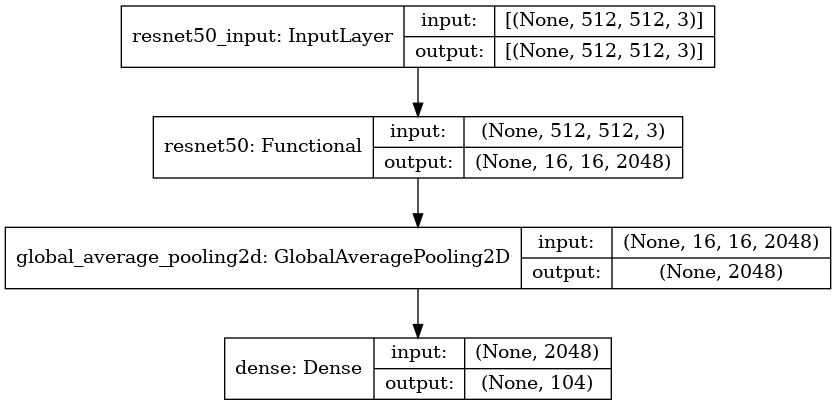

In [26]:
# schéma du modèle
tf.keras.utils.plot_model(ResNet50_model, show_shapes=True)

## **Entrainement du modèle**

In [27]:
BEST_MODEL_PATH = "/kaggle/working/ResNet50_model_best.h5"
FILE_DIR = os.path.dirname(BEST_MODEL_PATH)

<span style="font-size:16px;white-space: pre-line">On définit les callbacks function:<span>
* <span style="font-size:16px;"> earlystopping afin d’arrêter la formation lorsque la métrique 'val_loss' cesse de s’améliorer<span>
* <span style="font-size:16px;"> lr_callback pour définir le profil du taux learning rate<span>
* <span style="font-size:16px;white-space: pre-line">checkpointer afin de sauvegarder les paramètres du meilleur modèle pendant l'entrainement<span>
<span style="font-size:16px;">et ensuite on demarre l'entrainement<span>

In [28]:
earlystopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-4,
    patience=5,
    mode='auto',
    restore_best_weights=False,
    verbose=1)

checkpointer  = tf.keras.callbacks.ModelCheckpoint(
    filepath=BEST_MODEL_PATH,
    options=None,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='min')
    
callbacks = [earlystopping, lr_callback, checkpointer]

EPOCHS = 100
STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE
    
start_time = timeit.default_timer()
    
ResNet50_history = ResNet50_model.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    callbacks=callbacks,
    class_weight=dict_weights
)

ResNet50_model_elapsed = timeit.default_timer() - start_time
train_time = []
train_time.append(ResNet50_model_elapsed)

Epoch 1/100



Epoch 00001: LearningRateScheduler reducing learning rate to 0.0010000000474974513.

99/99 [==============================] - 93s 426ms/step - loss: 4.0138 - sparse_categorical_accuracy: 0.1148 - val_loss: 7.0821 - val_sparse_categorical_accuracy: 0.0022


2023-02-05 09:23:44.424182: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 66238, Output num: 0

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675589024.424107089","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 66238, Output num: 0","grpc_status":3}




Epoch 00001: val_loss improved from inf to 7.08213, saving model to /kaggle/working/ResNet50_model_best.h5

Epoch 2/100



Epoch 00002: LearningRateScheduler reducing learning rate to 0.0008100000379979611.

99/99 [==============================] - 33s 331ms/step - loss: 1.7948 - sparse_categorical_accuracy: 0.4606 - val_loss: 12.5306 - val_sparse_categorical_accuracy: 0.0022



Epoch 00002: val_loss did not improve from 7.08213

Epoch 3/100



Epoch 00003: LearningRateScheduler reducing learning rate to 0.0005060000335611404.

99/99 [==============================] - 34s 340ms/step - loss: 1.1776 - sparse_categorical_accuracy: 0.6091 - val_loss: 4.8519 - val_sparse_categorical_accuracy: 0.0442



Epoch 00003: val_loss improved from 7.08213 to 4.85188, saving model to /kaggle/working/ResNet50_model_best.h5

Epoch 4/100



Epoch 00004: LearningRateScheduler reducing learning rate to 0.00023240000449121004.

99/99 [==============================] - 33s 335ms/step - loss: 0.5919 - spars

In [29]:
# on sauvegarde l'historique d'entrainement du modèle
np.save('ResNet50_history.npy',ResNet50_history.history)

## **Performance du modèle**

<function matplotlib.pyplot.show(close=None, block=None)>

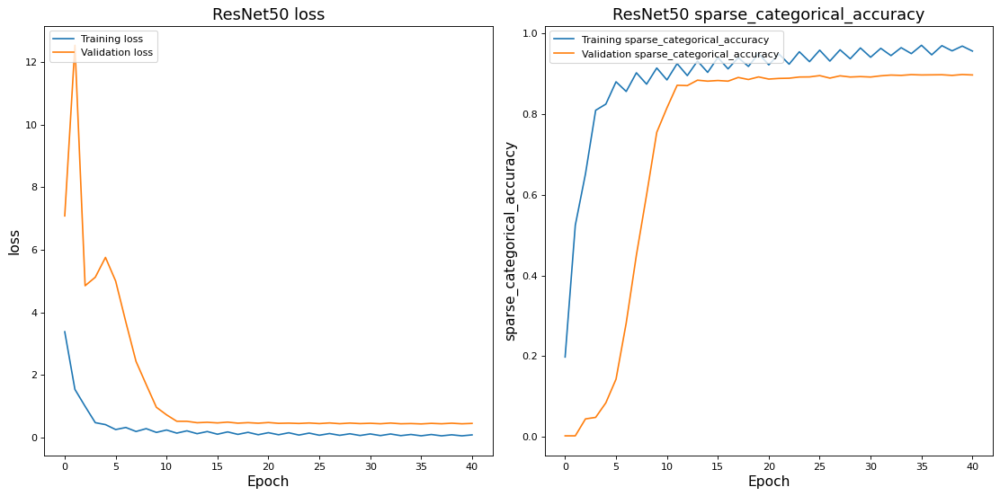

In [30]:
# on visualise les courbes de loss et accuracy sur le jeu de training et
# de validation pendant l'entrainement
fig = plt.figure(figsize=[14, 7], dpi=80)
i = 0
for metric in ['loss', 'sparse_categorical_accuracy']:
    i += 1
    fig.add_subplot(1, 2, i)
    ax = plt.plot(ResNet50_history.history[metric])
    plt.plot(ResNet50_history.history['val_'+metric])
    plt.title('ResNet50 ' + metric,fontsize=16)
    plt.legend(['Training ' + metric, 'Validation '+metric], loc='upper left')
    plt.ylabel(metric,fontsize=14)
    plt.xlabel('Epoch',fontsize=14)
plt.tight_layout()
plt.show

## **Matrice de confusion et performances**

In [31]:
#on charge le modèle avec les meilleurs paramètres obtenus lors de l'entrainement
ResNet50_model.load_weights(BEST_MODEL_PATH)

2023-02-05 09:47:35.307838: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 165040, Output num: 0

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675590455.307359878","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 165040, Output num: 0","grpc_status":3}


Text(0.5, 1.0, 'Confusion matrix with ResNet50')

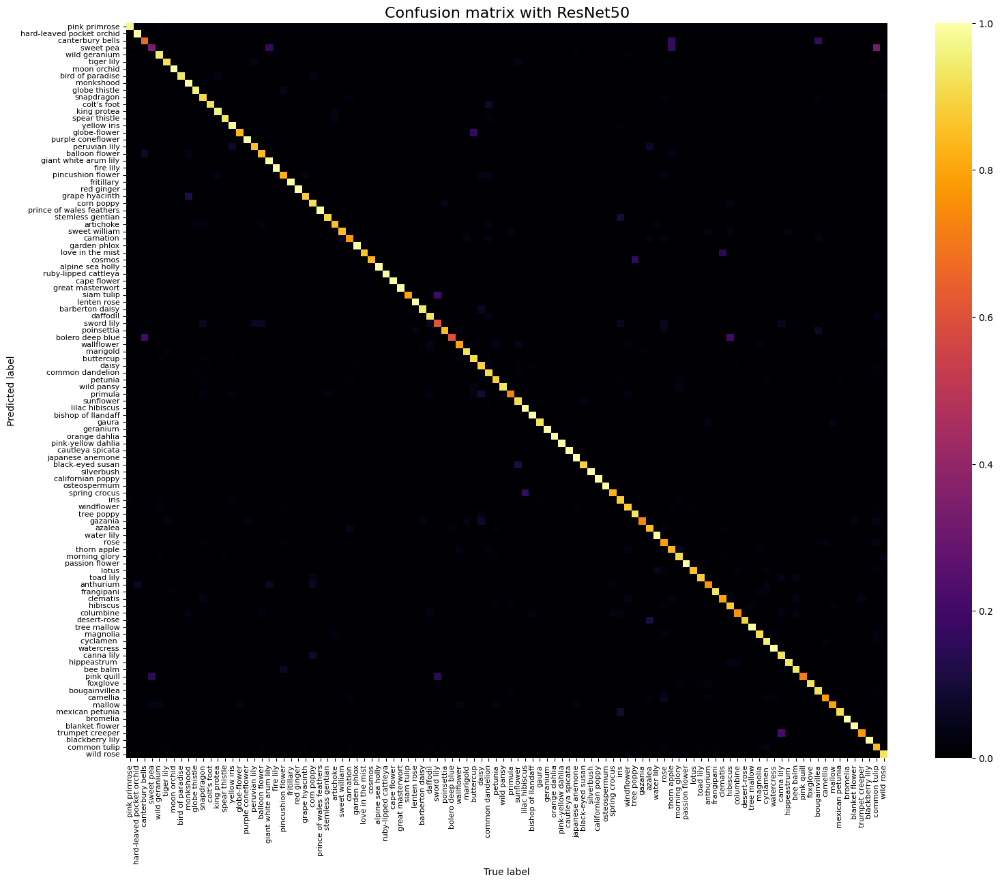

In [32]:
# on représente la matrice de confusion sur le jeu de validation à partir
# des classes vraies et prédictes
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = ResNet50_model.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize


# on visualize la matrice de confusion
fig = plt.figure(figsize=(18, 14))
sns.heatmap(cmat,
            xticklabels=CLASSES, yticklabels=CLASSES, annot=False, cmap='inferno')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title('Confusion matrix with ResNet50', fontsize=16)

In [33]:
# on calcule les métriques F1-score, precision et recall
# et on les sauvegarde avec les paramètres du modèle
# et les infos liées à l'entrainement
ResNet50_f1_score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
ResNet50_precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
ResNet50_recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)

max_train_accuracy = []
max_val_accuracy = []
min_val_loss = []
epochs = []
F1_score = []
precision = []
recall = []

ResNet50_history = np.load('/kaggle/working/ResNet50_history.npy', allow_pickle=True).item()

max_train_accuracy.append(max(ResNet50_history['sparse_categorical_accuracy']))
max_train_accuracy = [round(num,3) for num in max_train_accuracy]
max_val_accuracy.append(max(ResNet50_history['val_sparse_categorical_accuracy']))
max_val_accuracy = [round(num,3) for num in max_val_accuracy]
min_val_loss.append(min(ResNet50_history['val_loss']))
min_val_loss = [round(num,3) for num in min_val_loss]
epochs.append(len(ResNet50_history['val_loss']))
F1_score.append(ResNet50_f1_score)
F1_score = [round(num,3) for num in F1_score]
precision.append(ResNet50_precision)
precision = [round(num,3) for num in precision]
recall.append(ResNet50_recall)
recall = [round(num,3) for num in recall]

score = {'parameters': param_count, 'epochs': epochs, 'min_loss': min_val_loss, 
         'max_train_accuracy': max_train_accuracy, 'max_val_accuracy': max_val_accuracy, 
         'F1_score': F1_score, 'precision': precision, 'recall': recall}
score_df = pd.DataFrame(score,index=['ResNet50'])
score_df.to_csv('score_df.csv',index=False), 
score_df

,parameters,epochs,min_loss,max_train_accuracy,max_val_accuracy,F1_score,precision,recall
ResNet50,23800808,41,0.438,0.971,0.898,0.892,0.889,0.901


# **Modèle InceptionV3**

<span style="font-size:16px;">L’architecture Inception introduit le bloc Inception qui contient plusieurs couches de convolution et de pooling superposées, pour obtenir de meilleurs résultats et réduire le nombre de paramètres et donc les ressources de calcul par rapport à un réseau CNN standard.<span>

<table><tr>
<td> <img src="https://i.imgur.com/wihD3sr.png" width="600px"/> </td>
<td> <img src="https://i.imgur.com/Tb2OZWH.png" width="600px"/> </td>
</tr></table>
<p style="text-align:center;"><img src="https://i.imgur.com/WSi8GvE.png" width="1200px"/></p>

## **Chargement du modèle**

In [34]:
Inception_model = define_model(tf.keras.applications.InceptionV3)
score_df = pd.read_csv('/kaggle/working/score_df.csv')

Loading and compiling model..


87916544/87910968 [==============================] - 1s 0us/step

Model: "sequential"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


inception_v3 (Functional)    (None, 14, 14, 2048)      21802784  

_________________________________________________________________

global_average_pooling2d (Gl (None, 2048)              0         

_________________________________________________________________

dense (Dense)                (None, 104)               213096    


Total params: 22,015,880

Trainable params: 21,981,448

Non-trainable params: 34,432

_________________________________________________________________


In [35]:
# on sauvegarde l'info du nombre de paramètres du modèle
param_count = list(score_df['parameters'])
param_count.append(Inception_model.count_params())

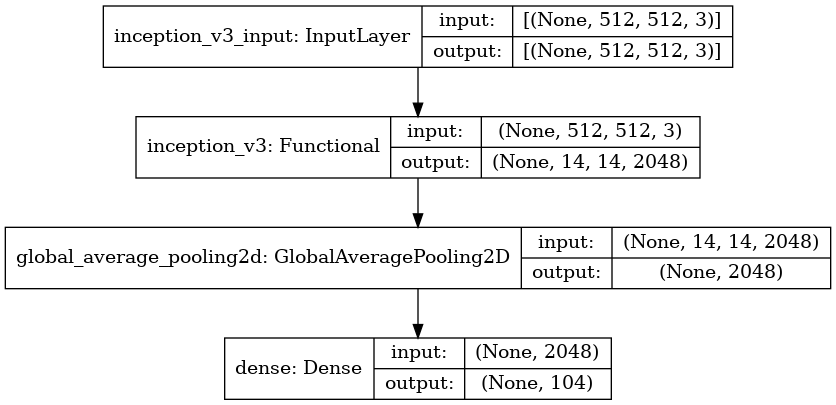

In [36]:
# schéma du modèle
tf.keras.utils.plot_model(Inception_model, show_shapes=True)

## **Entrainement du modèle**

In [37]:
BEST_MODEL_PATH = "/kaggle/working/Inception_model_best.h5"
FILE_DIR = os.path.dirname(BEST_MODEL_PATH)

In [38]:
earlystopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-4,
    patience=5,
    mode='auto',
    restore_best_weights=False,
    verbose=1)

checkpointer  = tf.keras.callbacks.ModelCheckpoint(
    filepath=BEST_MODEL_PATH,
    options=None,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='min')
    
callbacks = [earlystopping, lr_callback, checkpointer]

EPOCHS = 100
STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE
    
start_time = timeit.default_timer()
    
Inception_history = Inception_model.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    callbacks=callbacks,
    class_weight=dict_weights
)

Inception_model_elapsed = timeit.default_timer() - start_time
train_time.append(Inception_model_elapsed)

Epoch 1/100



Epoch 00001: LearningRateScheduler reducing learning rate to 0.0010000000474974513.

99/99 [==============================] - 119s 511ms/step - loss: 4.0809 - sparse_categorical_accuracy: 0.0980 - val_loss: 37.6938 - val_sparse_categorical_accuracy: 0.0075


2023-02-05 09:50:30.842878: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 203354, Output num: 1

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675590630.842802257","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 203354, Output num: 1","grpc_status":3}




Epoch 00001: val_loss improved from inf to 37.69384, saving model to /kaggle/working/Inception_model_best.h5

Epoch 2/100



Epoch 00002: LearningRateScheduler reducing learning rate to 0.0008100000379979611.

99/99 [==============================] - 32s 326ms/step - loss: 1.7506 - sparse_categorical_accuracy: 0.4787 - val_loss: 4.7361 - val_sparse_categorical_accuracy: 0.2430



Epoch 00002: val_loss improved from 37.69384 to 4.73611, saving model to /kaggle/working/Inception_model_best.h5

Epoch 3/100



Epoch 00003: LearningRateScheduler reducing learning rate to 0.0005060000335611404.

99/99 [==============================] - 33s 335ms/step - loss: 1.1303 - sparse_categorical_accuracy: 0.6229 - val_loss: 1.3846 - val_sparse_categorical_accuracy: 0.6455



Epoch 00003: val_loss improved from 4.73611 to 1.38461, saving model to /kaggle/working/Inception_model_best.h5

Epoch 4/100



Epoch 00004: LearningRateScheduler reducing learning rate to 0.00023240000449121004.

99/99 [=======

In [39]:
# on sauvegarde l'historique d'entrainement du modèle
np.save('Inception_history.npy',Inception_history.history)

## **Performance du modèle**

<function matplotlib.pyplot.show(close=None, block=None)>

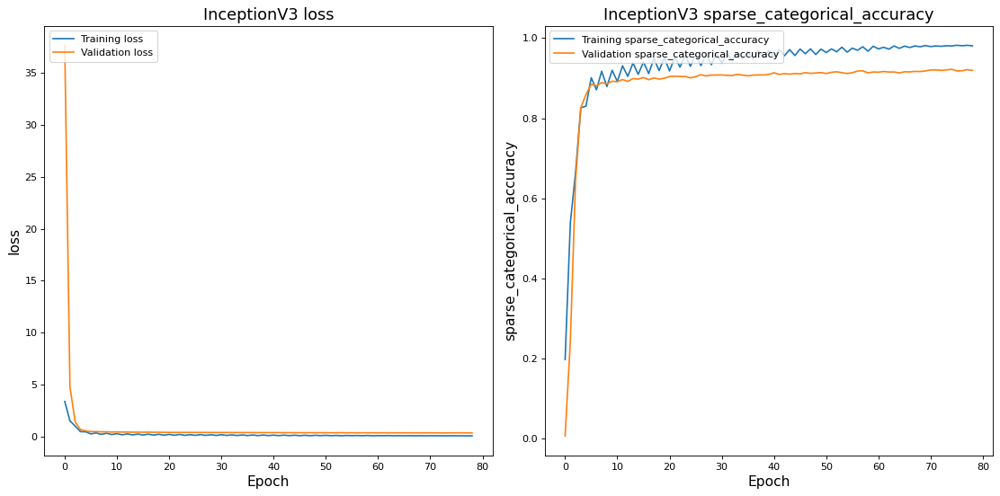

In [40]:
# on visualise les courbes de loss et accuracy sur le jeu de training et
# de validation pendant l'entrainement
fig = plt.figure(figsize=[14, 7], dpi=80)
i = 0
for metric in ['loss', 'sparse_categorical_accuracy']:
    i += 1
    fig.add_subplot(1, 2, i)
    ax = plt.plot(Inception_history.history[metric])
    plt.plot(Inception_history.history['val_' + metric])
    plt.title('InceptionV3 ' + metric,fontsize=16)
    plt.legend(['Training ' + metric, 'Validation ' + metric], loc='upper left')
    plt.ylabel(metric,fontsize=14)
    plt.xlabel('Epoch',fontsize=14)
plt.tight_layout()
plt.show

## **Matrice de confusion et performances** 

In [41]:
# on charge le modèle avec les meilleurs paramètres obtenus lors de l'entrainement
Inception_model.load_weights(BEST_MODEL_PATH)

2023-02-05 10:36:33.533499: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 419536, Output num: 0

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675593393.533323262","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 419536, Output num: 0","grpc_status":3}


Text(0.5, 1.0, 'Confusion matrix with InceptionV3')

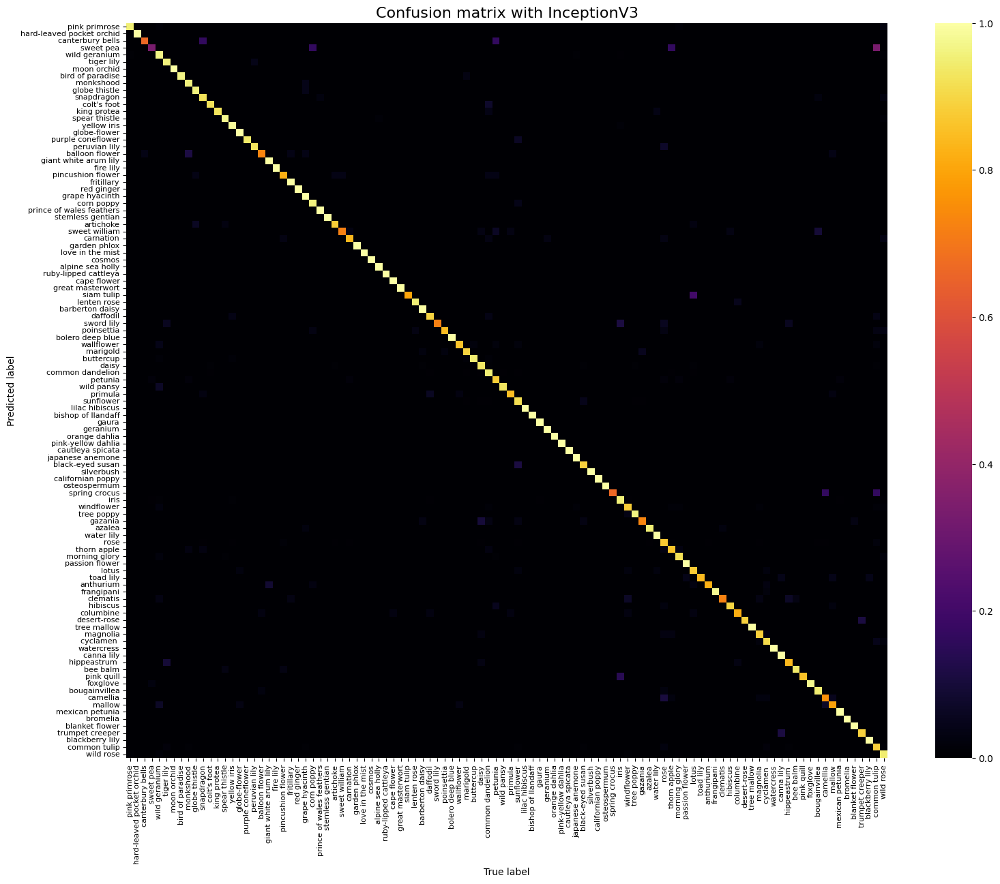

In [42]:
# on represente la matrice de confusion sur le jeu de validation à partir
# des classes vraies et prédictes

cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = Inception_model.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize


# on visualize la matrice de confusion
fig = plt.figure(figsize=(18, 14))
sns.heatmap(cmat,
            xticklabels=CLASSES, yticklabels=CLASSES, annot=False, cmap='inferno')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title('Confusion matrix with InceptionV3', fontsize=16)

In [43]:
# on calcule les métriques F1-score, precision et recall
# et on les sauvegarde avec les paramètres du modèle
# et les infos liées à l'entrainement

Inception_f1_score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
Inception_precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
Inception_recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
) 

Inception_history = np.load('/kaggle/working/Inception_history.npy', allow_pickle=True).item()

max_train_accuracy = list(score_df['max_train_accuracy'])
max_val_accuracy = list(score_df['max_val_accuracy'])
min_val_loss = list(score_df['min_loss'])
epochs = list(score_df['epochs'])
F1_score = list(score_df['F1_score'])
precision = list(score_df['precision'])
recall = list(score_df['recall'])

max_train_accuracy.append(max(Inception_history['sparse_categorical_accuracy']))
max_train_accuracy = [round(num,3) for num in max_train_accuracy]
max_val_accuracy.append(max(Inception_history['val_sparse_categorical_accuracy']))
max_val_accuracy = [round(num,3) for num in max_val_accuracy]
min_val_loss.append(min(Inception_history['val_loss']))
min_val_loss = [round(num,3) for num in min_val_loss]
epochs.append(len(Inception_history['val_loss']))
F1_score.append(Inception_f1_score)
F1_score = [round(num,3) for num in F1_score]
precision.append(Inception_precision)
precision = [round(num,3) for num in precision]
recall.append(Inception_recall)
recall = [round(num,3) for num in recall]

score = {'parameters': param_count, 'epochs': epochs, 'min_loss': min_val_loss, 
         'max_train_accuracy': max_train_accuracy, 'max_val_accuracy': max_val_accuracy, 
         'F1_score': F1_score, 'precision': precision, 'recall': recall}
score_df = pd.DataFrame(score,index=['ResNet50', 'InceptionV3'])
score_df.to_csv('score_df.csv',index=False), 
score_df

,parameters,epochs,min_loss,max_train_accuracy,max_val_accuracy,F1_score,precision,recall
ResNet50,23800808,41,0.438,0.971,0.898,0.892,0.889,0.901
InceptionV3,22015880,79,0.325,0.982,0.922,0.918,0.920,0.922


# **Modèle Xception**

<span style="font-size:16px;white-space: pre-line"> Xception est une extension de l’architecture Inception qui remplace le bloc Inception avec le bloc Modified Depthwise Separable Convolutions constitué d’une Pointwise Convolution suivie d’une Depthwise Convolution<span>

<table><tr>
<td> <img src="https://i.imgur.com/qcCURBe.png" width="600px"/> </td>
<td> <img src="https://i.imgur.com/WQoTe1h.png" width="600px"/> </td>
</tr></table>

<span style="font-size:16px;white-space: pre-line">Par rapport à la convolution conventionnelle, nous n’avons pas besoin d’effectuer la convolution sur tous les canaux. Cela signifie que le nombre de connexions est moindre et que le modèle est plus léger.<span>

## **Chargement du modèle**

In [44]:
Xception_model = define_model(tf.keras.applications.Xception)
score_df = pd.read_csv('/kaggle/working/score_df.csv')

Loading and compiling model..


83689472/83683744 [==============================] - 0s 0us/step: 

Model: "sequential"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


xception (Functional)        (None, 16, 16, 2048)      20861480  

_________________________________________________________________

global_average_pooling2d (Gl (None, 2048)              0         

_________________________________________________________________

dense (Dense)                (None, 104)               213096    


Total params: 21,074,576

Trainable params: 21,020,048

Non-trainable params: 54,528

_________________________________________________________________


In [45]:
# on sauvegarde l'info du nombre de paramètres du modèle
param_count = list(score_df['parameters'])
param_count.append(Inception_model.count_params())

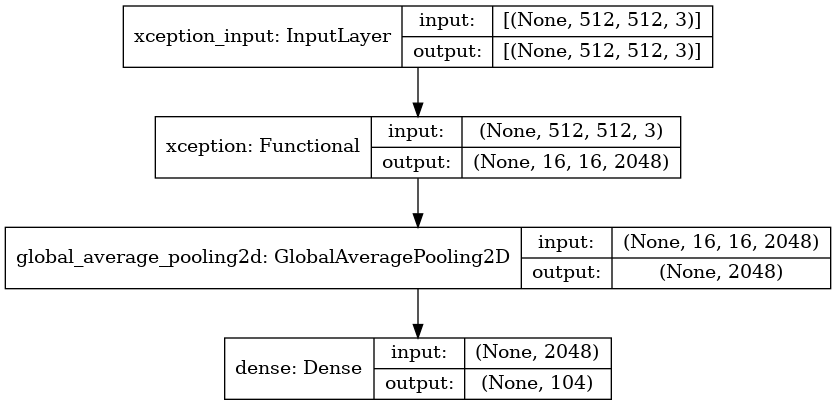

In [46]:
# schéma du modèle
tf.keras.utils.plot_model(Xception_model, show_shapes=True)

## **Entrainement du modèle**

In [47]:
BEST_MODEL_PATH = "/kaggle/working/Xception_model_best.h5"
FILE_DIR = os.path.dirname(BEST_MODEL_PATH)

In [48]:
earlystopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-4,
    patience=5,
    mode='auto',
    restore_best_weights=False,
    verbose=1)

checkpointer  = tf.keras.callbacks.ModelCheckpoint(
    filepath=BEST_MODEL_PATH,
    options=None,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='min')
    
callbacks = [earlystopping, lr_callback, checkpointer]

EPOCHS = 100
STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE
    
start_time = timeit.default_timer()
    
Xception_history = Xception_model.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    callbacks=callbacks,
    class_weight=dict_weights
)

Xception_model_elapsed = timeit.default_timer() - start_time
train_time.append(Xception_model_elapsed)

Epoch 1/100



Epoch 00001: LearningRateScheduler reducing learning rate to 0.0010000000474974513.

99/99 [==============================] - 88s 429ms/step - loss: 3.8248 - sparse_categorical_accuracy: 0.1765 - val_loss: 6.0410 - val_sparse_categorical_accuracy: 0.0951


2023-02-05 10:38:43.858131: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 440994, Output num: 1

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675593523.857887820","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 440994, Output num: 1","grpc_status":3}




Epoch 00001: val_loss improved from inf to 6.04098, saving model to /kaggle/working/Xception_model_best.h5

Epoch 2/100



Epoch 00002: LearningRateScheduler reducing learning rate to 0.0008100000379979611.

99/99 [==============================] - 35s 351ms/step - loss: 0.8575 - sparse_categorical_accuracy: 0.7283 - val_loss: 1.0937 - val_sparse_categorical_accuracy: 0.7150



Epoch 00002: val_loss improved from 6.04098 to 1.09365, saving model to /kaggle/working/Xception_model_best.h5

Epoch 3/100



Epoch 00003: LearningRateScheduler reducing learning rate to 0.0005060000335611404.

99/99 [==============================] - 36s 363ms/step - loss: 0.4601 - sparse_categorical_accuracy: 0.8366 - val_loss: 0.4753 - val_sparse_categorical_accuracy: 0.8742



Epoch 00003: val_loss improved from 1.09365 to 0.47525, saving model to /kaggle/working/Xception_model_best.h5

Epoch 4/100



Epoch 00004: LearningRateScheduler reducing learning rate to 0.00023240000449121004.

99/99 [============

In [49]:
# on sauvegarde l'historique d'entrainement du modèle
np.save('Xception_history.npy',Xception_history.history)

## **Performance du modèle**

<function matplotlib.pyplot.show(close=None, block=None)>

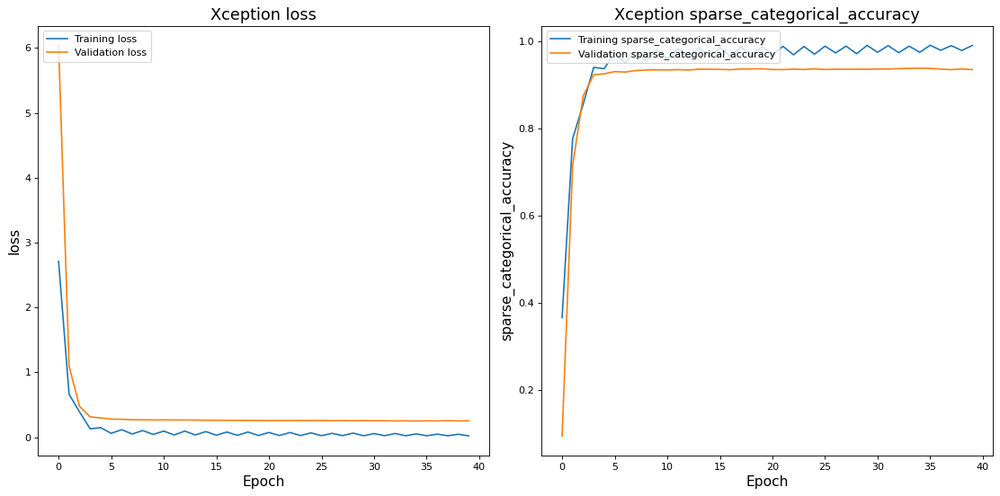

In [50]:
# on visualise les courbes de loss et accuracy sur le jeu de training et
# de validation pendant l'entrainement
fig = plt.figure(figsize=[14, 7], dpi=80)
i = 0
for metric in ['loss', 'sparse_categorical_accuracy']:
    i += 1
    fig.add_subplot(1, 2, i)
    ax = plt.plot(Xception_history.history[metric])
    plt.plot(Xception_history.history['val_' + metric])
    plt.title('Xception ' + metric,fontsize=16)
    plt.legend(['Training ' + metric, 'Validation ' + metric], loc='upper left')
    plt.ylabel(metric,fontsize=14)
    plt.xlabel('Epoch',fontsize=14)
plt.tight_layout()
plt.show

## **Matrice de confusion et performances**

In [51]:
# on charge le modèle avec les meilleurs paramètres obtenus lors de l'entrainement
Xception_model.load_weights(BEST_MODEL_PATH)

2023-02-05 11:02:45.563040: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 533124, Output num: 0

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675594965.562779275","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 533124, Output num: 0","grpc_status":3}


Text(0.5, 1.0, 'Confusion matrix with Xception')

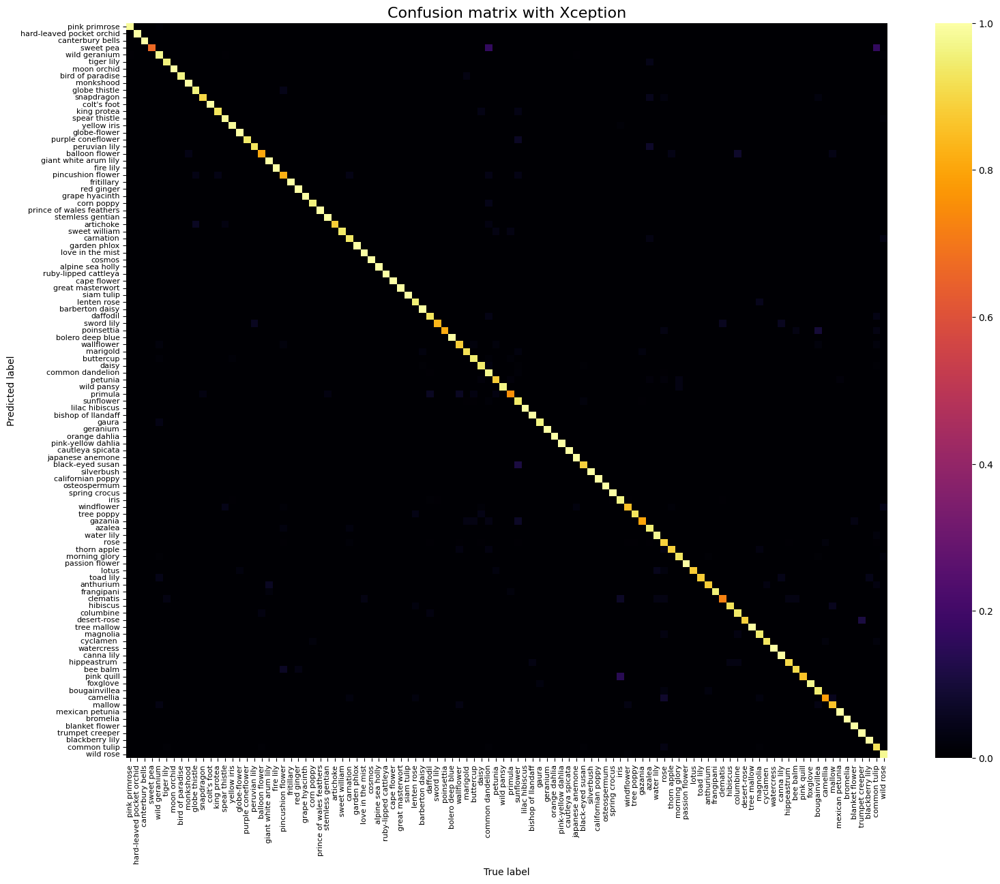

In [52]:
# on représente la matrice de confusion sur le jeu de validation à partir
# des classes vraies et prédites

cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = Xception_model.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize


# # on visualise la matrice de confusion
fig = plt.figure(figsize=(18, 14))
sns.heatmap(cmat,
            xticklabels=CLASSES, yticklabels=CLASSES, annot=False, cmap='inferno')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title('Confusion matrix with Xception', fontsize=16)

In [53]:
# on calcule les métriques F1-score, precision et recall
# et on les sauvegarde avec les paramètres du modèle
# et les infos liées à l'entrainement
Xception_f1_score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
Xception_precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
Xception_recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)

Xception_history = np.load('/kaggle/working/Xception_history.npy', allow_pickle=True).item()

max_train_accuracy = list(score_df['max_train_accuracy'])
max_val_accuracy = list(score_df['max_val_accuracy'])
min_val_loss = list(score_df['min_loss'])
epochs = list(score_df['epochs'])
F1_score = list(score_df['F1_score'])
precision = list(score_df['precision'])
recall = list(score_df['recall'])

max_train_accuracy.append(max(Xception_history['sparse_categorical_accuracy']))
max_train_accuracy = [round(num,3) for num in max_train_accuracy]
max_val_accuracy.append(max(Xception_history['val_sparse_categorical_accuracy']))
max_val_accuracy = [round(num,3) for num in max_val_accuracy]
min_val_loss.append(min(Xception_history['val_loss']))
min_val_loss = [round(num,3) for num in min_val_loss]
epochs.append(len(Xception_history['val_loss']))
F1_score.append(Xception_f1_score)
F1_score = [round(num,3) for num in F1_score]
precision.append(Xception_precision)
precision = [round(num,3) for num in precision]
recall.append(Xception_recall)
recall = [round(num,3) for num in recall]

score = {'parameters': param_count, 'epochs': epochs, 'min_loss': min_val_loss, 
         'max_train_accuracy': max_train_accuracy, 'max_val_accuracy': max_val_accuracy, 
         'F1_score': F1_score, 'precision': precision, 'recall': recall}
score_df = pd.DataFrame(score,index=['ResNet50', 'InceptionV3', 'Xception'])
score_df.to_csv('score_df.csv', index=False), 
score_df

,parameters,epochs,min_loss,max_train_accuracy,max_val_accuracy,F1_score,precision,recall
ResNet50,23800808,41,0.438,0.971,0.898,0.892,0.889,0.901
InceptionV3,22015880,79,0.325,0.982,0.922,0.918,0.920,0.922
Xception,22015880,40,0.250,0.991,0.938,0.942,0.942,0.946


# **Modèle Vision Transformer (ViT)**

<span style="font-size:16px;white-space: pre-line">Vision Transformer est un modèle de classification d’image récent (Oct 2020) qui remplace le réseau CNN (Convolutional Neural Network) avec une architecture transformer-based.<span>
<span style="font-size:16px;white-space: pre-line">Les Transformers ont représenté la base pour le développement d’algorithmes NLP très performants comme BERT, GPT-3 et ViT est la première implémentation des transformers qui a depassé le SOTA avec plusieurs benchmarks.<span>
<span style="font-size:16px;white-space: pre-line">L’architecture de ViT consiste des blocs suivants :<span>

<table><tr>
<td> <img src="https://i.imgur.com/wrTeOYU.png" width="600px"/> </td>
<td> <img src="https://i.imgur.com/deDyzvm.png" width="600px"/> </td>
</tr></table>

<span style="font-size:16px;white-space: pre-line">ViT fait un split de l’image avec sections de 16x16 pixels, non superposés.  Les sections sont 'flattened' et convertis en embedded vectors. Une embedding classe trainable supplémentaire est ajoutée pour la classification. Une positional embedding est ensuite ajoutée aux embedded vectors de l'image pour garder une trace de la séquence. <span>
<span style="font-size:16px;white-space: pre-line">Le Transformer encoder est composé de plusieurs stacks de blocs identiques. Chaque bloc est doté d’une couche Attention Multi-Head suivie d’une couche Feed-Forward. Il y a une connexion résiduelle autour de chacune des deux sous-couches, suivie d’une couche de normalisation. Le Multi-Head Attention in Vision Transformers l’aide à ne prêter attention qu’à la partie pertinente de l’image. Toutes les sous-couches ainsi que les couches d'embedding dans le modèle produisent une sortie de dimension embedded D. Le vecteur en sortie de l’étape précédente d'embedding est passé par l’architecture du Transformer Encoder pour obtenir enfin le vecteur de contexte. <span>

<table><tr>
<td> <img src="https://i.imgur.com/GsVR6YA.png" width="200px"/> </td>
<td> <img src="https://i.imgur.com/dcqIXVy.png" width="200px"/> </td>
</tr></table>

<span style="font-size:16px;white-space: pre-line">Le vecteur c0 du context vector est envoyè à la tête MLP pour nous donner le vecteur de probabilité final pour la prédiction de la classe. <span>
<span style="font-size:16px;white-space: pre-line">Le modèle ViT n’a pas les mêmes propriétés des modèles CNN et donc demande un entrainement plus profond avec plus de data pour apprendre les mêmes caractéristiques d’un modèle CNN. 
En revanche le modèle CNN est capable dans les premières layers de détecter exclusivement des caractéristiques locales de l’image et devient capables de détecter des caractéristiques globales sur l’image seulement dans les layers plus profonds différemment du modèle ViT qui peut extraire des caractéristiques globales du premier layer.<span>


## **Chargement du modèle**

In [19]:
IMAGE_SIZE = 512

K.clear_session()
with strategy.scope():
    pretrained_model = vit.vit_b16(
        image_size=IMAGE_SIZE,
        activation='softmax',
        pretrained=True,
        include_top=False,
        pretrained_top=False,
        classes=104)

    ViT_model = tf.keras.Sequential([
        pretrained_model,
        tf.keras.layers.Flatten(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(11, activation=tfa.activations.gelu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(104, 'softmax')], name='vision_transformer')

learning_rate = 1e-4

optimizer = tfa.optimizers.RectifiedAdam(learning_rate=learning_rate)

ViT_model.compile(optimizer=optimizer,
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['sparse_categorical_accuracy'])

ViT_model.summary()

score_df = pd.read_csv('/kaggle/input/resnet50-inception-xception/score_df.csv')
score_df.at[2, 'parameters'] = 21074576
score_df


347504640/347502902 [==============================] - 3s 0us/step

Model: "vision_transformer"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


vit-b16 (Functional)         (None, 768)               86434560  

_________________________________________________________________

flatten (Flatten)            (None, 768)               0         

_________________________________________________________________

batch_normalization (BatchNo (None, 768)               3072      

_________________________________________________________________

dense (Dense)                (None, 11)                8459      

_________________________________________________________________

batch_normalization_1 (Batch (None, 11)                44        

_________________________________________________________________

dense_1 (Dense)              (None, 104)               1248      


Total params: 86,447,383

Tra

,parameters,epochs,min_loss,max_train_accuracy,max_val_accuracy,F1_score,precision,recall
0,23800808,41,0.438,0.971,0.898,0.892,0.889,0.901
1,22015880,79,0.325,0.982,0.922,0.918,0.920,0.922
2,21074576,40,0.250,0.991,0.938,0.942,0.942,0.946


In [20]:
# on sauvegarde l'info du nombre de paramètres du modèle
param_count = list(score_df['parameters'])
param_count.append(ViT_model.count_params())

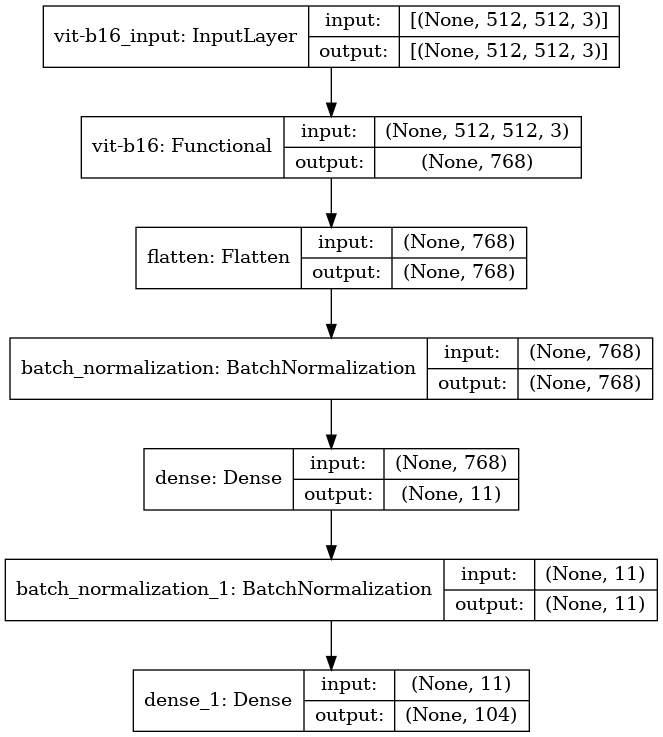

In [21]:
# schéma du modèle
tf.keras.utils.plot_model(ViT_model, show_shapes=True)

## **Entrainement du modèle**

In [22]:
earlystopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-4,
    patience=10,
    mode='auto',
    restore_best_weights=False,
    verbose=1)


BEST_MODEL_PATH = "/kaggle/working/ViT_model_best.h5"
FILE_DIR = os.path.dirname(BEST_MODEL_PATH)

checkpointer = tf.keras.callbacks.ModelCheckpoint(
    filepath=BEST_MODEL_PATH,
    options=None,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='min')

callbacks = [earlystopping, checkpointer]

In [23]:
EPOCHS = 150

STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE

ViT_history = ViT_model.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    callbacks=callbacks
    )

Epoch 1/150

99/99 [==============================] - 199s 1s/step - loss: 4.6457 - sparse_categorical_accuracy: 0.0391 - val_loss: 3.9428 - val_sparse_categorical_accuracy: 0.2179


2023-02-05 15:43:11.237272: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 23092, Output num: 1

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675611791.237140377","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 23092, Output num: 1","grpc_status":3}




Epoch 00001: val_loss improved from inf to 3.94282, saving model to /kaggle/working/ViT_model_best.h5

Epoch 2/150

99/99 [==============================] - 87s 879ms/step - loss: 4.0085 - sparse_categorical_accuracy: 0.2503 - val_loss: 3.5163 - val_sparse_categorical_accuracy: 0.4868



Epoch 00002: val_loss improved from 3.94282 to 3.51633, saving model to /kaggle/working/ViT_model_best.h5

Epoch 3/150

99/99 [==============================] - 87s 881ms/step - loss: 3.7637 - sparse_categorical_accuracy: 0.4376 - val_loss: 3.4033 - val_sparse_categorical_accuracy: 0.6207



Epoch 00003: val_loss improved from 3.51633 to 3.40326, saving model to /kaggle/working/ViT_model_best.h5

Epoch 4/150

99/99 [==============================] - 87s 878ms/step - loss: 3.6363 - sparse_categorical_accuracy: 0.5399 - val_loss: 3.3291 - val_sparse_categorical_accuracy: 0.6848



Epoch 00004: val_loss improved from 3.40326 to 3.32914, saving model to /kaggle/working/ViT_model_best.h5

Epoch 5/150

99/

In [24]:
# on sauvegarde l'historique d’entrainement du modèle
np.save('ViT_history.npy',ViT_history.history)

## **Performance du modèle**

<function matplotlib.pyplot.show(close=None, block=None)>

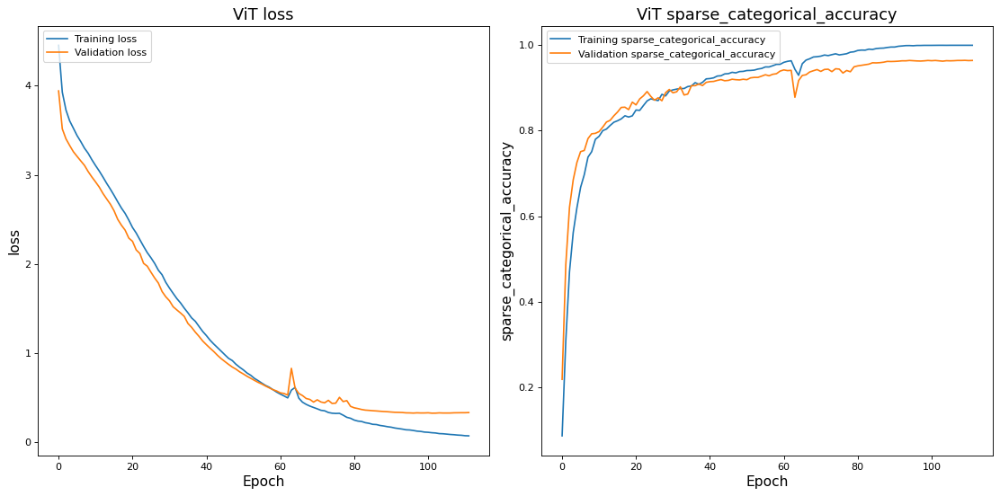

In [25]:
# on visualise les courbes de loss et accuracy sur le jeu de training et
# de validation pendant l'entrainement
fig = plt.figure(figsize=[14, 7], dpi=80)
i = 0
for metric in ['loss', 'sparse_categorical_accuracy']:
    i += 1
    fig.add_subplot(1, 2, i)
    ax = plt.plot(ViT_history.history[metric])
    plt.plot(ViT_history.history['val_' + metric])
    plt.title('ViT ' + metric, fontsize=16)
    plt.legend(['Training ' + metric, 'Validation ' + metric],
               loc='upper left')
    plt.ylabel(metric, fontsize=14)
    plt.xlabel('Epoch', fontsize=14)
plt.tight_layout()
plt.show

## **Visuation des Attention Maps**

<span style="font-size:16px;white-space: pre-line">On visualise les Attention Maps sur l’image d’entrée à l’aide de la fonction « visualize.attention_map », qui calcule la moyenne des « Attention Weights » entre toutes les têtes du Multi-Head Self-Attention de chaque Encoder. <span>

In [28]:
from vit_keras import vit, utils, visualize
import PIL
from PIL import Image
import cv2

image_size=512
no_aug_train_batch = (next(iter(no_aug_train_set.unbatch().take(1))))

pretrained_model = vit.vit_b16(
    image_size=image_size,
    activation='softmax',
    pretrained=True,
    include_top=False,
    pretrained_top=False,
    classes=104)

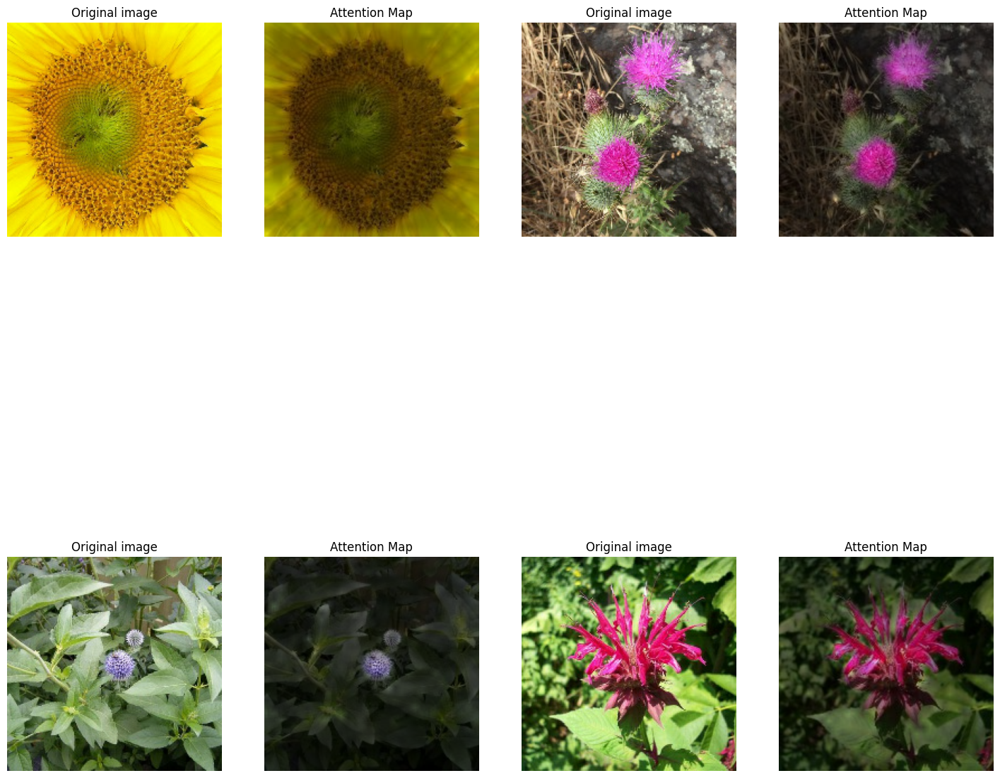

In [29]:
plt.figure(figsize=(18, 18))
t=0
for i in range(2):
    image,label=next(iter(no_aug_train_set.unbatch().take(1)))
    numpy_image = image.numpy()
    plt.subplot(2, 4, 4*t + 1)
    plt.imshow(numpy_image)
    plt.axis('off')
    plt.title('Original image')
    img = PIL.Image.fromarray((numpy_image * 255).astype(np.uint8))
    img = img.convert('RGB')
    img.save("/kaggle/working/attention_map.jpg")


    image = utils.read("/kaggle/working/attention_map.jpg", image_size)
    attention_map = visualize.attention_map(model=pretrained_model, image=image)
    plt.subplot(2, 4, 4*t + 2)
    plt.imshow(attention_map)
    plt.axis('off')
    plt.title('Attention Map')
    
    image,label=next(iter(no_aug_train_set.unbatch().take(1)))
    numpy_image = image.numpy()
    plt.subplot(2, 4, 4*t + 3)
    plt.imshow(numpy_image)
    plt.axis('off')
    plt.title('Original image')
    img = PIL.Image.fromarray((numpy_image * 255).astype(np.uint8))
    img = img.convert('RGB')
    img.save("/kaggle/working/attention_map.jpg")


    image = utils.read("/kaggle/working/attention_map.jpg", image_size)
    attention_map = visualize.attention_map(model=pretrained_model, image=image)
    plt.subplot(2, 4, 4*t + 4)
    plt.imshow(attention_map)
    plt.axis('off')
    plt.title('Attention Map')
    t+=1
    

## **Matrice de confusion et performances**

In [38]:
# on charge le modèle avec les meilleurs paramètres obtenus lors de l'entrainement
ViT_model.load_weights(BEST_MODEL_PATH)

2023-02-05 18:31:22.949345: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 237402, Output num: 0

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675621882.949191851","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 237402, Output num: 0","grpc_status":3}


Text(0.5, 1.0, 'Confusion matrix with ViT')

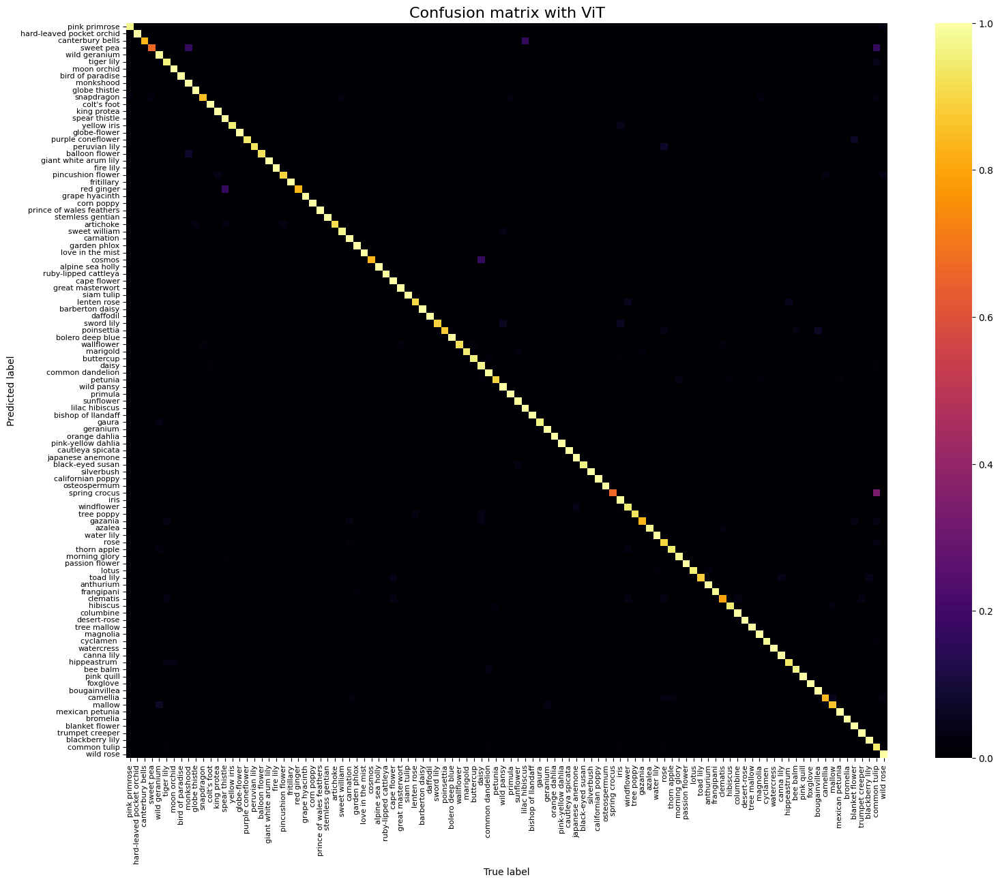

In [39]:
# on représente la matrice de confusion sur le jeu de validation à partir
# des classes vraies et prédites
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = ViT_model.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize


# on visualise la matrice de confusion
fig = plt.figure(figsize=(18, 14))
sns.heatmap(cmat,
            xticklabels=CLASSES, yticklabels=CLASSES, annot=False, cmap='inferno')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title('Confusion matrix with ViT', fontsize=16)

In [40]:
# on calcule les métriques F1-score, precision et recall
# et on les sauvegarde avec les paramètres du modèle
# et les infos liées à l'entrainement
ViT_f1_score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
ViT_precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
ViT_recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)

ViT_history = np.load('/kaggle/working/ViT_history.npy', allow_pickle=True).item()

max_train_accuracy = list(score_df['max_train_accuracy'])
max_val_accuracy = list(score_df['max_val_accuracy'])
min_val_loss = list(score_df['min_loss'])
epochs = list(score_df['epochs'])
F1_score = list(score_df['F1_score'])
precision = list(score_df['precision'])
recall = list(score_df['recall'])

max_train_accuracy.append(max(ViT_history['sparse_categorical_accuracy']))
max_train_accuracy = [round(num,3) for num in max_train_accuracy]
max_val_accuracy.append(max(ViT_history['val_sparse_categorical_accuracy']))
max_val_accuracy = [round(num,3) for num in max_val_accuracy]
min_val_loss.append(min(ViT_history['val_loss']))
min_val_loss = [round(num,3) for num in min_val_loss]
epochs.append(len(ViT_history['val_loss']))
F1_score.append(ViT_f1_score)
F1_score = [round(num,3) for num in F1_score]
precision.append(ViT_precision)
precision = [round(num,3) for num in precision]
recall.append(ViT_recall)
recall = [round(num,3) for num in recall]
score = {'parameters': param_count, 'epochs': epochs, 'min_loss': min_val_loss, 
         'max_train_accuracy': max_train_accuracy, 
         'max_val_accuracy': max_val_accuracy, 
         'F1_score': F1_score, 
         'precision': precision, 
         'recall': recall}
score_df = pd.DataFrame(score,index=['ResNet50','InceptionV3','Xception','ViT'])
score_df.to_csv('score_df.csv',index=False), 
score_df

,parameters,epochs,min_loss,max_train_accuracy,max_val_accuracy,F1_score,precision,recall
ResNet50,23800808,41,0.438,0.971,0.898,0.892,0.889,0.901
InceptionV3,22015880,79,0.325,0.982,0.922,0.918,0.920,0.922
Xception,21074576,40,0.250,0.991,0.938,0.942,0.942,0.946
ViT,86447383,112,0.320,1.000,0.965,0.960,0.962,0.961


# **Modèle EfficientNetB7**

<span style="font-size:16px;white-space: pre-line">EfficientNet est un groupe de modèles de réseau convolutionnel qui a permis d’atteindre très bonnes performances avec la base de données Imagenet avec très peu de paramètres par rapport aux autres modèles. Le groupe de modèles EfficientNet comprend 8 modèles, de B0-B7, où chaque modèle renvoie chronologiquement à une plus grande précision et à un plus grand nombre de paramètres. <span>
<span style="font-size:16px;white-space: pre-line">EfficientNet définit une architecture de base très simple EfficientNet-B0 et une méthode efficace, le ‘Compound Scaling’, pour augmenter la taille du modèle afin d’obtenir une amélioration des performances.
MBConv est le bloc principal du modèle EfficientNet. MBConv est constitué d’une ‘Shortcut Connection’ entre le début et la fin d’un bloc convolutif.<span>

<table><tr>
<td> <img src="https://i.imgur.com/9vBIdZH.png" width="600px"/> </td>
<td> <img src="https://i.imgur.com/xrOufv8.png" width="600px"/> </td>
</tr></table>
<p style="text-align:center;"><img src="https://i.imgur.com/cK6W8em.png" width="800px"/></p>
<table><tr>
<p style="text-align:center;"><img src="https://i.imgur.com/jfTFGr0.png" width="800px"/></p>

## **Chargement du modèle**

In [20]:
with strategy.scope():
    load_locally = tf.saved_model.LoadOptions(experimental_io_device='/job:localhost')
    pretrained_model = hub.KerasLayer(
        'https://tfhub.dev/tensorflow/efficientnet/b7/feature-vector/1', 
        trainable=True, input_shape=[*IMAGE_SIZE, 3], load_options=load_locally)
    EfficientNetB7_model = tf.keras.Sequential([
        # le format demandé pour les images pour les modèles TFHub est float32 dans [0,1]
        tf.keras.layers.Lambda(lambda data: tf.image.convert_image_dtype(data, tf.float32),
                               input_shape=[*IMAGE_SIZE, 3]),
        pretrained_model, 
        tf.keras.layers.Dense(len(CLASSES), activation='softmax')
    ])
EfficientNetB7_model.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['sparse_categorical_accuracy'],
)

EfficientNetB7_model.summary()

score_df = pd.read_csv('/kaggle/input/vision-transformer/score_df.csv')
score_df

Model: "sequential"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


lambda (Lambda)              (None, 512, 512, 3)       0         

_________________________________________________________________

keras_layer (KerasLayer)     (None, 2560)              64097680  

_________________________________________________________________

dense (Dense)                (None, 104)               266344    


Total params: 64,364,024

Trainable params: 64,053,304

Non-trainable params: 310,720

_________________________________________________________________


,parameters,epochs,min_loss,max_train_accuracy,max_val_accuracy,F1_score,precision,recall
0,23800808,41,0.438,0.971,0.898,0.892,0.889,0.901
1,22015880,79,0.325,0.982,0.922,0.918,0.920,0.922
2,21074576,40,0.250,0.991,0.938,0.942,0.942,0.946
3,86447383,112,0.320,1.000,0.965,0.960,0.962,0.961


In [21]:
# on sauvegarde l'info du nombre de paramètres du modèle
param_count = list(score_df['parameters'])
param_count.append(EfficientNetB7_model.count_params())

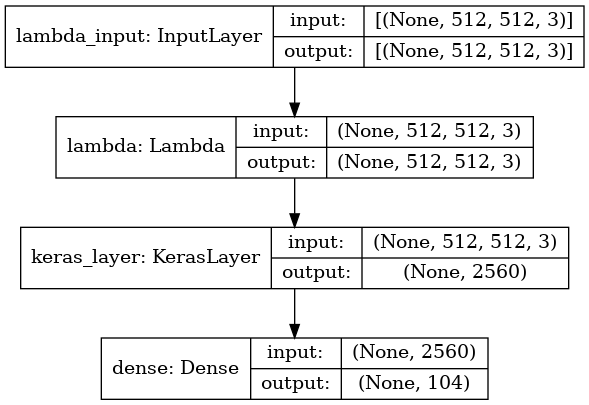

In [23]:
# schéma du modèle
tf.keras.utils.plot_model(EfficientNetB7_model, show_shapes=True)

## **Entrainement du modèle**

In [24]:
earlystopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-4,
    patience=5,
    mode='auto',
    restore_best_weights=False,
    verbose=1)


BEST_MODEL_PATH = "/kaggle/working/EfficientNetB7_model_best.h5"
FILE_DIR = os.path.dirname(BEST_MODEL_PATH)

checkpointer = tf.keras.callbacks.ModelCheckpoint(
    filepath=BEST_MODEL_PATH,
    options=None,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='min')

callbacks = [earlystopping, lr_callback, checkpointer]

In [25]:
EPOCHS = 150

STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE

EfficientNetB7_history = EfficientNetB7_model.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    callbacks=callbacks,
    class_weight=dict_weights
)

Epoch 1/150



Epoch 00001: LearningRateScheduler reducing learning rate to 0.0010000000474974513.

99/99 [==============================] - 355s 1s/step - loss: 3.6865 - sparse_categorical_accuracy: 0.2572 - val_loss: 2.2817 - val_sparse_categorical_accuracy: 0.5593


2023-02-07 14:54:11.127708: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 67096, Output num: 1

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675781651.127556390","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 67096, Output num: 1","grpc_status":3}




Epoch 00001: val_loss improved from inf to 2.28169, saving model to /kaggle/working/EfficientNetB7_model_best.h5

Epoch 2/150



Epoch 00002: LearningRateScheduler reducing learning rate to 0.0008100000379979611.

99/99 [==============================] - 94s 954ms/step - loss: 1.2137 - sparse_categorical_accuracy: 0.7204 - val_loss: 0.9947 - val_sparse_categorical_accuracy: 0.8397



Epoch 00002: val_loss improved from 2.28169 to 0.99466, saving model to /kaggle/working/EfficientNetB7_model_best.h5

Epoch 3/150



Epoch 00003: LearningRateScheduler reducing learning rate to 0.0005060000335611404.

99/99 [==============================] - 96s 970ms/step - loss: 0.8646 - sparse_categorical_accuracy: 0.8110 - val_loss: 0.7302 - val_sparse_categorical_accuracy: 0.9127



Epoch 00003: val_loss improved from 0.99466 to 0.73018, saving model to /kaggle/working/EfficientNetB7_model_best.h5

Epoch 4/150



Epoch 00004: LearningRateScheduler reducing learning rate to 0.00023240000449121004.

9

In [26]:
# on sauvegarde l'historique d’entrainement du modèle
np.save('EfficientNetB7_history.npy',EfficientNetB7_history.history)

## **Performance du modèle**

<function matplotlib.pyplot.show(close=None, block=None)>

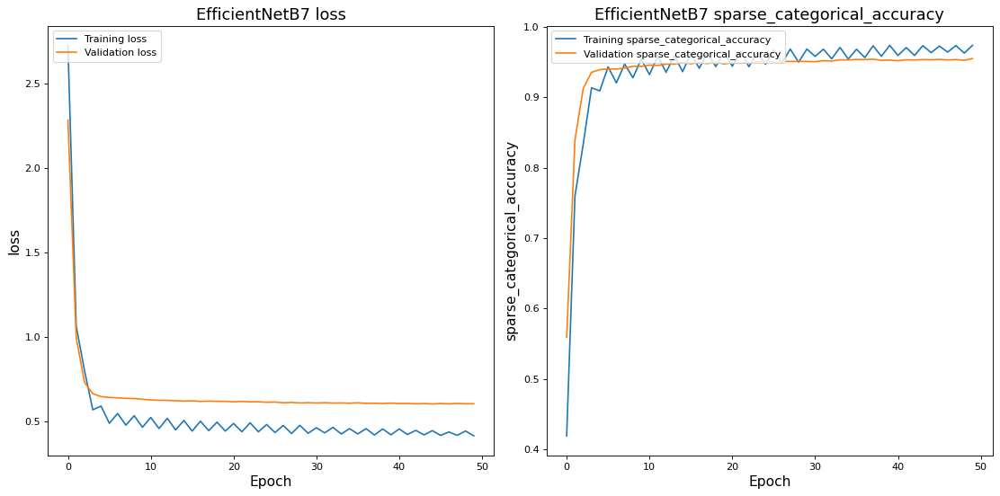

In [27]:
# on visualise les courbes de loss et accuracy sur le jeu de training et
# de validation pendant l'entrainement
fig = plt.figure(figsize=[14, 7], dpi=80)
i = 0
for metric in ['loss', 'sparse_categorical_accuracy']:
    i += 1
    fig.add_subplot(1, 2, i)
    ax = plt.plot(EfficientNetB7_history.history[metric])
    plt.plot(EfficientNetB7_history.history['val_' + metric])
    plt.title('EfficientNetB7 ' + metric, fontsize=16)
    plt.legend(['Training '+ metric, 'Validation ' + metric],
               loc='upper left')
    plt.ylabel(metric, fontsize=14)
    plt.xlabel('Epoch', fontsize=14)
plt.tight_layout()
plt.show

## **Matrice de confusion et performances**

In [28]:
# on charge le modèle avec les meilleurs paramètres obtenus lors de l'entrainement
EfficientNetB7_model.load_weights(BEST_MODEL_PATH)

Text(0.5, 1.0, 'Confusion matrix with EfficientNetB7')

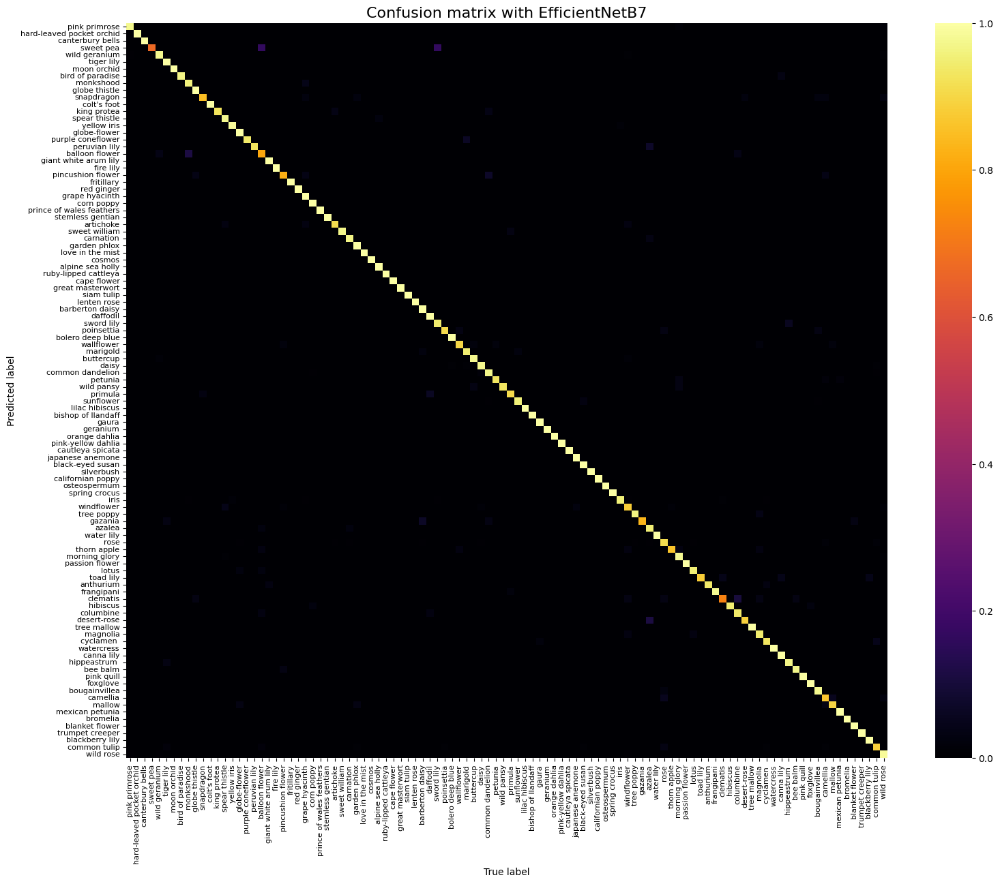

In [30]:
# on représente la matrice de confusion sur le jeu de validation à partir
# des classes vraies et prédites
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = EfficientNetB7_model.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize


# on visualise la matrice de confusion
fig = plt.figure(figsize=(18, 14))
sns.heatmap(cmat,
            xticklabels=CLASSES, yticklabels=CLASSES, annot=False, cmap='inferno')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title('Confusion matrix with EfficientNetB7', fontsize=16)

In [31]:
# on calcule les métriques F1-score, precision et recall
# et on les sauvegarde avec les paramètres du modèle
# et les infos liées à l'entrainement
EfficientNetB7_f1_score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
EfficientNetB7_precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
EfficientNetB7_recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)

EfficientNetB7_history = np.load('/kaggle/working/EfficientNetB7_history.npy', 
                                 allow_pickle=True).item()

max_train_accuracy = list(score_df['max_train_accuracy'])
max_val_accuracy = list(score_df['max_val_accuracy'])
min_val_loss = list(score_df['min_loss'])
epochs = list(score_df['epochs'])
F1_score = list(score_df['F1_score'])
precision = list(score_df['precision'])
recall = list(score_df['recall'])

max_train_accuracy.append(max(EfficientNetB7_history['sparse_categorical_accuracy']))
max_train_accuracy = [round(num,3) for num in max_train_accuracy]
max_val_accuracy.append(max(EfficientNetB7_history['val_sparse_categorical_accuracy']))
max_val_accuracy = [round(num,3) for num in max_val_accuracy]
min_val_loss.append(min(EfficientNetB7_history['val_loss']))
min_val_loss = [round(num,3) for num in min_val_loss]
epochs.append(len(EfficientNetB7_history['val_loss']))
F1_score.append(EfficientNetB7_f1_score)
F1_score = [round(num,3) for num in F1_score]
precision.append(EfficientNetB7_precision)
precision = [round(num,3) for num in precision]
recall.append(EfficientNetB7_recall)
recall = [round(num,3) for num in recall]
score = {'parameters': param_count, 'epochs': epochs, 'min_loss': min_val_loss, 
         'max_train_accuracy': max_train_accuracy, 
         'max_val_accuracy': max_val_accuracy, 
         'F1_score': F1_score, 
         'precision': precision, 
         'recall': recall}
score_df = pd.DataFrame(score,index=['ResNet50','InceptionV3','Xception','ViT','EfficientNetB7'])
score_df.to_csv('score_df.csv',index=False), 
score_df

,parameters,epochs,min_loss,max_train_accuracy,max_val_accuracy,F1_score,precision,recall
ResNet50,23800808,41,0.438,0.971,0.898,0.892,0.889,0.901
InceptionV3,22015880,79,0.325,0.982,0.922,0.918,0.920,0.922
Xception,21074576,40,0.250,0.991,0.938,0.942,0.942,0.946
ViT,86447383,112,0.320,1.000,0.965,0.960,0.962,0.961
EfficientNetB7,64364024,50,0.602,0.974,0.955,0.952,0.947,0.961


# **Evaluation des performances des modèles**

<span style="font-size:16px;white-space: pre-line">On compare les performances des differents modèles. <span>

dict_keys(['parameters', 'epochs', 'min_loss', 'max_train_accuracy', 'max_val_accuracy', 'F1_score', 'precision', 'recall'])


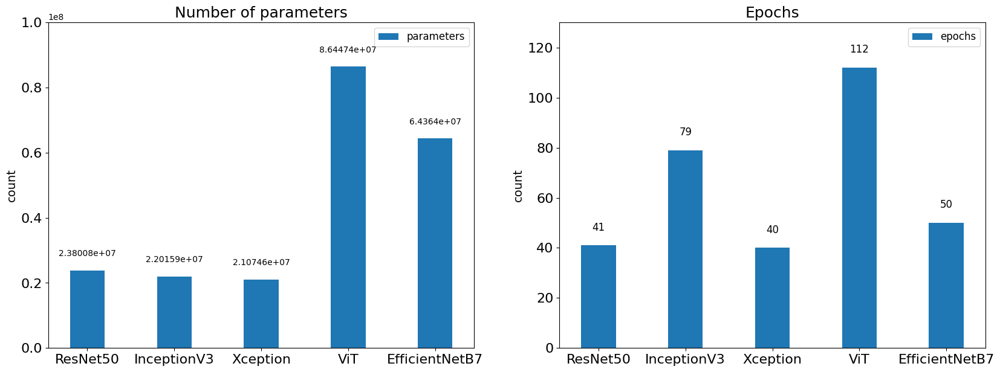

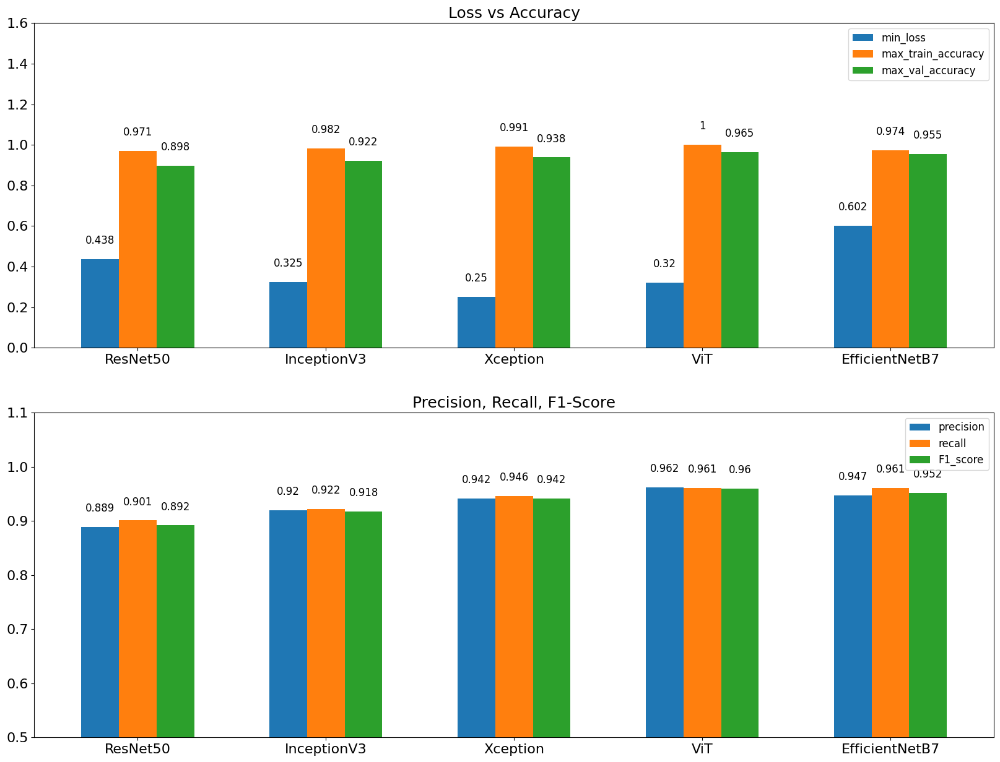

In [34]:
fontsize1 = 18
fontsize2 = 16
fontsize3 = 14
fontsize4 = 12

print(score.keys())
width = 0.2

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,7))

barchart1 = score_df.plot.bar(ax=axes[0], y='parameters', width=width*2, rot=0, 
                              fontsize=fontsize2)
barchart1.bar_label(axes[0].containers[0], label_type='edge', padding=15)
axes[0].set_ylim(top=10e+07)
axes[0].set_ylabel('count', fontsize=fontsize3)
axes[0].set_title('Number of parameters', fontsize=fontsize1)
axes[0].set_xticklabels(['ResNet50', 'InceptionV3', 'Xception', 'ViT', 'EfficientNetB7'], 
                        fontsize=fontsize2)
axes[0].legend(fontsize=fontsize4)
 
barchart2 = score_df.plot.bar(ax=axes[1], y='epochs', ylabel='count', 
                              width=width*2, rot=0, fontsize=fontsize2)
barchart2.bar_label(axes[1].containers[0], label_type='edge', padding=15, fontsize = fontsize4)
axes[1].set_ylim(top=130)
axes[1].set_ylabel('count', fontsize=fontsize3)
axes[1].set_title('Epochs', fontsize=fontsize1)
axes[1].set_xticklabels(['ResNet50', 'InceptionV3', 'Xception', 'ViT', 'EfficientNetB7'], 
                        fontsize=fontsize2)
axes[1].legend(fontsize=fontsize4)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20,15))

barchart3 = score_df.plot.bar(ax=axes[0], y=['min_loss', 'max_train_accuracy', 'max_val_accuracy'], 
                              width=width*3, rot=0, fontsize=fontsize2)
barchart3.bar_label(axes[0].containers[0], label_type='edge', padding=15, fontsize = fontsize4)
barchart3.bar_label(axes[0].containers[1], label_type='edge', padding=15, fontsize = fontsize4)
barchart3.bar_label(axes[0].containers[2], label_type='edge', padding=15, fontsize = fontsize4)
axes[0].set_ylim(top=1.6)
axes[0].set_title('Loss vs Accuracy', fontsize=fontsize1)
axes[0].set_xticklabels(['ResNet50','InceptionV3','Xception','ViT', 'EfficientNetB7'], 
                        fontsize=fontsize2)
axes[0].legend(fontsize=fontsize4)

barchart4 = score_df.plot.bar(ax=axes[1], y=['precision', 'recall', 'F1_score'], 
                              width=width*3, rot=0, fontsize=fontsize2)
barchart4.bar_label(axes[1].containers[0], label_type='edge', padding=15, fontsize = fontsize4)
barchart4.bar_label(axes[1].containers[1], label_type='edge', padding=15, fontsize = fontsize4)
barchart4.bar_label(axes[1].containers[2], label_type='edge', padding=15, fontsize = fontsize4)
axes[1].set_ylim(bottom=0.5, top=1.1)
axes[1].set_title('Precision, Recall, F1-Score', fontsize=fontsize1)
axes[1].set_xticklabels(['ResNet50', 'InceptionV3', 'Xception', 'ViT', 'EfficientNetB7'], 
                        fontsize=fontsize2)
axes[1].legend(fontsize=fontsize4)

<span style="font-size:16px;white-space: pre-line">Le modèle de classification plus performant est donc Vision Transformer suivi par EfficientNetB7 et Xception. Vision Transformer est le modèle plus complexe en termes de nombre de paramètres et celui qui a été entrainé plus longtemps. <span>

# **Modèle Ensemble: Xception et Vision Transformer**

<span style="font-size:16px;white-space: pre-line">Afin de maximiser la performance sur le jeu de test on utilise les Ensembles Models qui sont des modèles prédictifs qui combinent les prévisions de deux ou plusieurs autres modèles. Les modèles qui contribuent à l’ensemble, peuvent être du même type ou de types différents et peuvent ou non être formés sur les mêmes données de formation. Les prédictions faites par les membres de l’ensemble peuvent être combinées à l’aide de statistiques, comme le mode ou la moyenne. <span>
<span style="font-size:16px;white-space: pre-line">Il y a deux raisons principales d’utiliser un ensemble plutôt qu’un seul modèle, et elles sont liées : <span>
* <span style="font-size:16px;white-space: pre-line">Performance : un ensemble peut faire de meilleures prévisions et obtenir de meilleures performances que n’importe quel modèle contributif.<span>
* <span style="font-size:16px;white-space: pre-line">Robustesse : un ensemble réduit la dispersion des prédictions et de la performance du modèle.<span>

<p style="text-align:center;"><img src="https://i.imgur.com/csS2j5r.png" width="600px"/></p>

<span style="font-size:16px;white-space: pre-line">Les modèles Ensemble sont divisé en quatre catégories :<span>
* <span style="font-size:16px;white-space: pre-line">Sequential methods – Méthodes avec ‘base learners’ qui utilisent données d’entrée qui dépendent du ‘base learner’ précèdent (BOOSTING)<span>
* <span style="font-size:16px;white-space: pre-line">Parallel methods - Méthodes qui utilisent données d’entrée indépendants (RANDOM FOREST)<span>
* <span style="font-size:16px;white-space: pre-line">Homogeneous Ensemble” : combinaison de la même typologie de classifieur<span>
* <span style="font-size:16px;white-space: pre-line">Heterogeneous Ensemble” : combinaison de classifieurs de typologies différentes<span>

## **Technique Weighted Average**

<span style="font-size:16px;white-space: pre-line">On a utilisé une méthode parallèle avec un Heterogeneous ensemble car on a combiné avec une moyenne pesée les résultats des classifieurs Xception et Vision Transformer et EfficientNetB7 et Vision Transformer, tous entrainées sur le même jeu de données.
Les poids de la moyenne pesées des résultats ont été calculés sur la base des prédictions sur le jeu de validation des deux modèles afin de maximiser le F1-score.<span>

In [21]:
# on charge les modèles Xception et ViT avec le meilleur jeu de paramètres
Xception_model = define_model(tf.keras.applications.Xception)
Xception_model.load_weights('/kaggle/input/resnet50-inception-xception/Xception_model_best.h5')

IMAGE_SIZE = 512
with strategy.scope():
    pretrained_model = vit.vit_b16(
        image_size=IMAGE_SIZE,
        activation='softmax',
        pretrained=True,
        include_top=False,
        pretrained_top=False,
        classes=104)

    ViT_model = tf.keras.Sequential([
        pretrained_model,
        tf.keras.layers.Flatten(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(11, activation=tfa.activations.gelu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(104, 'softmax')], name='vision_transformer')
    
ViT_model.summary()

ViT_model.load_weights('/kaggle/input/vision-transformer/ViT_model_best.h5')

score_df = pd.read_csv('/kaggle/input/efficientnetb7/score_df.csv')
score_df

Loading and compiling model..


83689472/83683744 [==============================] - 0s 0us/step

Model: "sequential"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


xception (Functional)        (None, 16, 16, 2048)      20861480  

_________________________________________________________________

global_average_pooling2d (Gl (None, 2048)              0         

_________________________________________________________________

dense (Dense)                (None, 104)               213096    


Total params: 21,074,576

Trainable params: 21,020,048

Non-trainable params: 54,528

_________________________________________________________________


347504640/347502902 [==============================] - 15s 0us/step

Model: "vision_transformer"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


vit-b16 (Functional)   

,parameters,epochs,min_loss,max_train_accuracy,max_val_accuracy,F1_score,precision,recall
0,23800808,41,0.438,0.971,0.898,0.892,0.889,0.901
1,22015880,79,0.325,0.982,0.922,0.918,0.920,0.922
2,21074576,40,0.250,0.991,0.938,0.942,0.942,0.946
3,86447383,112,0.320,1.000,0.965,0.960,0.962,0.961
4,64364024,50,0.602,0.974,0.955,0.952,0.947,0.961


In [22]:
# on définit le meilleur paramètre alpha pour la moyenne pesée des prédictions des deux modèles
IMAGE_SIZE = [512,512]
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()
cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
print('Predicting with ViT_best_model')
m1 = ViT_model.predict(images_ds)
print('Predicting with Xception_best_model')
m2 = Xception_model.predict(images_ds)

scores = []
for alpha in np.linspace(0,1,100):
    cm_probabilities = alpha*m1 + (1-alpha)*m2
    cm_predictions = np.argmax(cm_probabilities, axis=-1)
    scores.append(f1_score(cm_correct_labels, cm_predictions, 
                           labels=range(len(CLASSES)), 
                           average='macro'))

best_alpha = np.argmax(scores) / 100
# on calcule les prédictions des deux modèles
cm_probabilities = best_alpha*m1 + (1-best_alpha)*m2
cm_predictions = np.argmax(cm_probabilities, axis=-1)

print(best_alpha, max(scores))

Predicting with ViT_best_model

Predicting with Xception_best_model


2023-02-09 11:28:37.919646: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 42019, Output num: 0

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675942117.919438596","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 42019, Output num: 0","grpc_status":3}


0.49 0.9690173528895492


Correct labels:  (3712,) [ 50  13  74 ... 102  48  67]

Predicted labels:  (3712,) [ 50  13  74 ... 102  48  67]


Text(0.5, 1.0, 'Best alpha of ensemble model Xception-ViT')

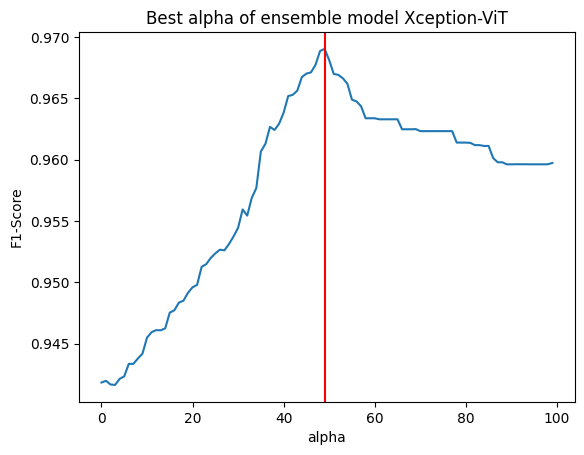

In [23]:
# on visualise la paerformance du modèle Ensemble Xception-ViT
# avec la variation de alpha
print("Correct labels: ", cm_correct_labels.shape, cm_correct_labels)
print("Predicted labels: ", cm_predictions.shape, cm_predictions)
plt.plot(scores)
plt.axvline(x=best_alpha*100, color='red')
plt.xlabel('alpha')
plt.ylabel('F1-Score')
plt.title('Best alpha of ensemble model Xception-ViT')

## **Matrice de confusion et performance**

Text(0.5, 1.0, 'Confusion matrix with Ensemble model Xception-Vision transformer')

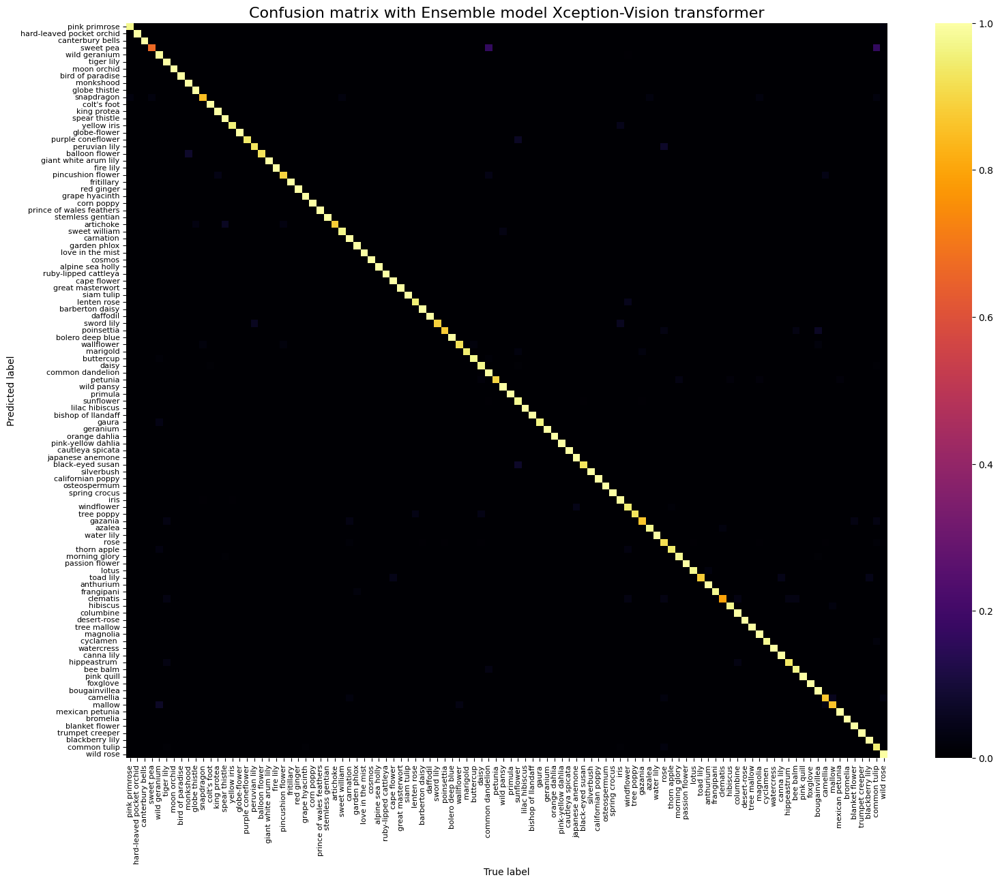

In [24]:
# on représente la matrice de confusion sur le jeu de validation à partir
# des classes vraies et prédites
import seaborn as sns
from sklearn.metrics import classification_report

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = best_alpha*m1+(1-best_alpha)*m2
cm_predictions = np.argmax(cm_probabilities, axis=-1)


labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T


# on visualise la matrice de confusion
fig = plt.figure(figsize=(18, 14))
sns.heatmap(cmat,
            xticklabels=CLASSES, yticklabels=CLASSES, annot=False, cmap='inferno')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title('Confusion matrix with Ensemble model Xception-Vision transformer', 
          fontsize=16)

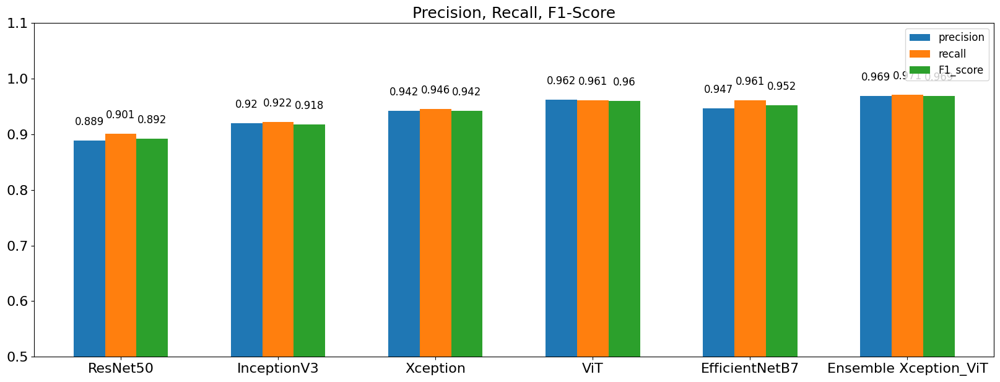

In [26]:
# on calcule les métriques F1-score, precision et recall
# et on les sauvegarde
Xception_ViT_f1_score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
Xception_ViT_precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
Xception_ViT_recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)

F1_score = list(score_df['F1_score'])
precision = list(score_df['precision'])
recall = list(score_df['recall'])

F1_score.append(Xception_ViT_f1_score)
F1_score = [round(num,3) for num in F1_score]
precision.append(Xception_ViT_precision)
precision = [round(num,3) for num in precision]
recall.append(Xception_ViT_recall)
recall = [round(num,3) for num in recall]
score_Xception_ViT = {'F1_score': F1_score, 
                      'precision': precision, 
                      'recall': recall}
score_Xception_ViT_df = pd.DataFrame(score_Xception_ViT,index=['ResNet50','InceptionV3','Xception','ViT', 
                                                               'EfficientNetB7','Ensemble Xception_ViT'])
score_Xception_ViT_df.to_csv('score_Xception_ViT_df.csv',index=False), 
score_Xception_ViT_df

# on visualise les performances des modèles
fontsize1 = 18
fontsize2 = 16
fontsize3 = 14
fontsize4 = 12

width = 0.2

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,7))

barchart = score_Xception_ViT_df.plot.bar(ax = axes, y=['precision', 'recall', 'F1_score'], 
                             width=width*3, 
                             rot=0, 
                             fontsize=fontsize2)
barchart.bar_label(axes.containers[0], 
                   label_type='edge', 
                   padding=15, 
                   fontsize = fontsize4)
barchart.bar_label(axes.containers[1], 
                   label_type='edge', 
                   padding=15, 
                   fontsize = fontsize4)
barchart.bar_label(axes.containers[2], 
                   label_type='edge', 
                   padding=15, 
                   fontsize=fontsize4)
axes.set_ylim(bottom=0.5, 
              top=1.1)
axes.set_title('Precision, Recall, F1-Score', fontsize=fontsize1)
axes.set_xticklabels(['ResNet50','InceptionV3','Xception','ViT', 'EfficientNetB7', 'Ensemble Xception_ViT'], 
                     fontsize=fontsize2)
axes.legend(fontsize=fontsize4)

In [20]:
score_Xception_ViT_df = pd.read_csv('/kaggle/input/ensemble-xcept-vit/score_Xception_ViT_df.csv')
score_Xception_ViT_df.rename(index={0:'ResNet50',1:'InceptionV3',2:'Xception',3:'ViT',4:'EfficientNetB7', 5:'Xception_ViT'})

,F1_score,precision,recall
ResNet50,0.892,0.889,0.901
InceptionV3,0.918,0.920,0.922
Xception,0.942,0.942,0.946
ViT,0.960,0.962,0.961
EfficientNetB7,0.952,0.947,0.961
Xception_ViT,0.969,0.969,0.971


# **Modèle Ensemble: EfficientNetB7 et Vision Transformer**

In [21]:
# on charge les modèles EfficientNetB7 et ViT avec le meilleur jeu de paramètres
with strategy.scope():
    IMAGE_SIZE = [512,512]
    load_locally = tf.saved_model.LoadOptions(experimental_io_device='/job:localhost')
    pretrained_model = hub.KerasLayer(
        'https://tfhub.dev/tensorflow/efficientnet/b7/feature-vector/1', 
        trainable=True, input_shape=[*IMAGE_SIZE, 3], load_options=load_locally)
    EfficientNetB7_model = tf.keras.Sequential([
        # the expected image format for all TFHub image models is float32 in [0,1) range
        tf.keras.layers.Lambda(lambda data: tf.image.convert_image_dtype(data, tf.float32), 
                               input_shape=[*IMAGE_SIZE, 3]),
        pretrained_model, 
        tf.keras.layers.Dense(len(CLASSES), activation='softmax')
    ])
    
    IMAGE_SIZE = 512
    pretrained_model = vit.vit_b16(
        image_size=IMAGE_SIZE,
        activation='softmax',
        pretrained=True,
        include_top=False,
        pretrained_top=False,
        classes=104)

    ViT_model = tf.keras.Sequential([
        pretrained_model,
        tf.keras.layers.Flatten(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(11, activation=tfa.activations.gelu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(104, 'softmax')], name='vision_transformer')
    
EfficientNetB7_model.summary()    
ViT_model.summary()

EfficientNetB7_model.load_weights('/kaggle/input/efficientnetb7/EfficientNetB7_model_best.h5')
ViT_model.load_weights('/kaggle/input/vision-transformer/ViT_model_best.h5')

score_df = pd.read_csv('/kaggle/input/ensemble-xcept-vit/score_Xception_ViT_df.csv')
score_df


347504640/347502902 [==============================] - 11s 0us/step

Model: "sequential"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


lambda (Lambda)              (None, 512, 512, 3)       0         

_________________________________________________________________

keras_layer (KerasLayer)     (None, 2560)              64097680  

_________________________________________________________________

dense (Dense)                (None, 104)               266344    


Total params: 64,364,024

Trainable params: 64,053,304

Non-trainable params: 310,720

_________________________________________________________________

Model: "vision_transformer"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


vit-b16 (Functional)         (None, 768)               86434560  

_____________________________________________________

,F1_score,precision,recall
0,0.892,0.889,0.901
1,0.918,0.920,0.922
2,0.942,0.942,0.946
3,0.960,0.962,0.961
4,0.952,0.947,0.961
5,0.969,0.969,0.971


In [22]:
# on définit le meilleur paramètre alpha pour la moyenne pesée des prédictions des deux modèles
IMAGE_SIZE = [512,512]
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()
cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
print('Predicting with ViT_best_model')
m1 = ViT_model.predict(images_ds)
print('Predicting with EfficientNetB7_best_model')
m2 = EfficientNetB7_model.predict(images_ds)

scores = []
for alpha in np.linspace(0,1,100):
    cm_probabilities = alpha*m1 + (1-alpha)*m2
    cm_predictions = np.argmax(cm_probabilities, axis=-1)
    scores.append(f1_score(cm_correct_labels, cm_predictions, 
                           labels=range(len(CLASSES)), 
                           average='macro'))

best_alpha = np.argmax(scores) / 100
cm_probabilities = best_alpha*m1 + (1-best_alpha)*m2
cm_predictions = np.argmax(cm_probabilities, axis=-1)

print(best_alpha, max(scores))

Predicting with ViT_best_model

Predicting with EfficientNetB7_best_model


2023-02-09 12:16:06.670288: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 88776, Output num: 0

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675944966.670200637","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 88776, Output num: 0","grpc_status":3}


0.45 0.9670607227891276


Correct labels:  (3712,) [ 50  13  74 ... 102  48  67]

Predicted labels:  (3712,) [ 50  13  74 ... 102  48  67]


Text(0.5, 1.0, 'Best alpha of ensemble model EfficientNetB7-ViT')

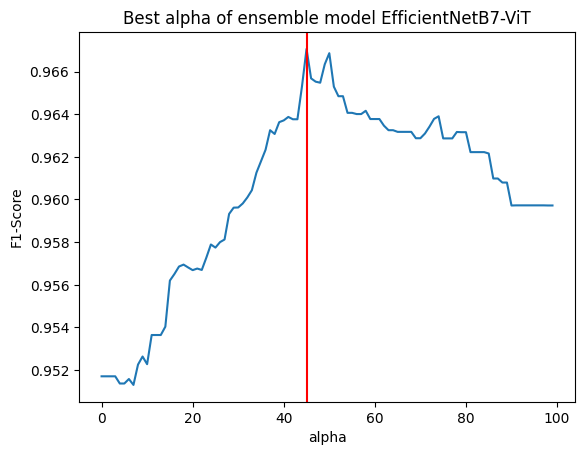

In [31]:
# on visualise la performance du modèle Ensemble EfficientNetB7-ViT
# avec la variation de alpha
print("Correct labels: ", cm_correct_labels.shape, cm_correct_labels)
print("Predicted labels: ", cm_predictions.shape, cm_predictions)
plt.plot(scores)
plt.axvline(x=best_alpha*100, color='red')
plt.xlabel('alpha')
plt.ylabel('F1-Score')
plt.title('Best alpha of ensemble model EfficientNetB7-ViT')

## **Matrice de confusion et performance**

Text(0.5, 1.0, 'Confusion matrix with Ensemble model EfficientNetB7-Vision transformer')

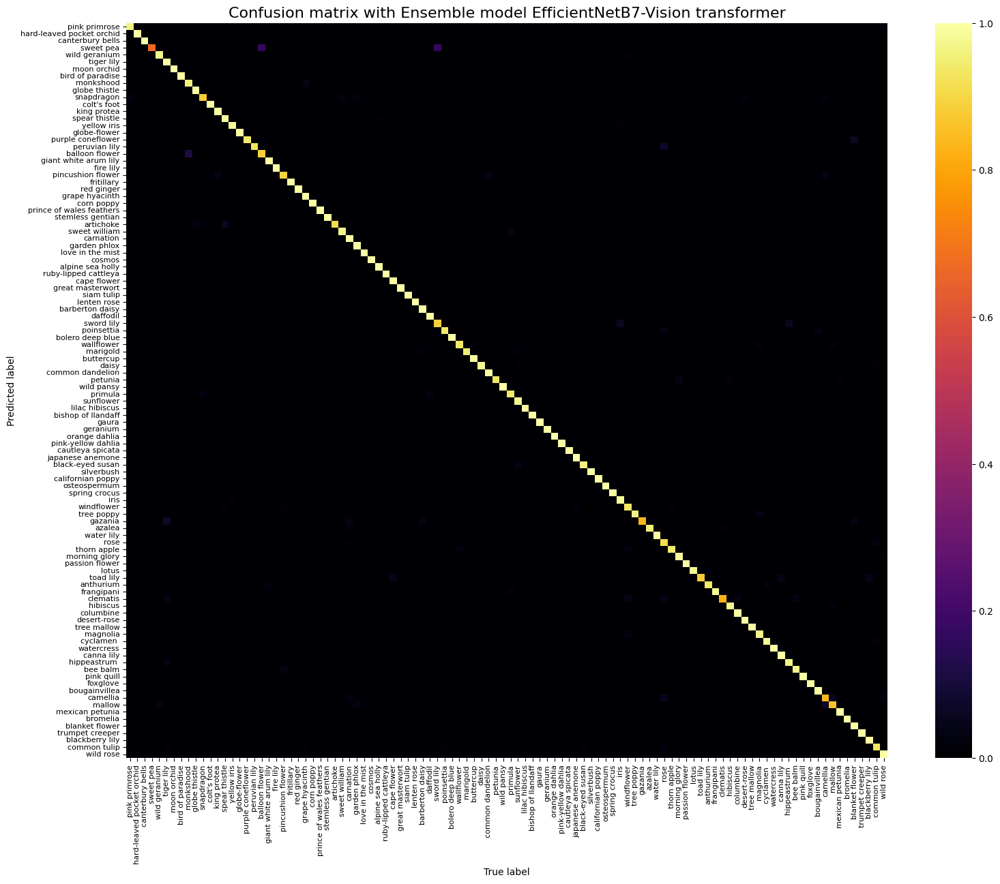

In [23]:
# on représente la matrice de confusion sur le jeu de validation à partir
# des classes vraies et prédites
cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = best_alpha*m1+(1-best_alpha)*m2
cm_predictions = np.argmax(cm_probabilities, axis=-1)


labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T


# on visualise la matrice de confusion
fig = plt.figure(figsize=(18, 14))
sns.heatmap(cmat,
            xticklabels=CLASSES, yticklabels=CLASSES, annot=False, cmap='inferno')
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title('Confusion matrix with Ensemble model EfficientNetB7-Vision transformer', 
          fontsize=16)

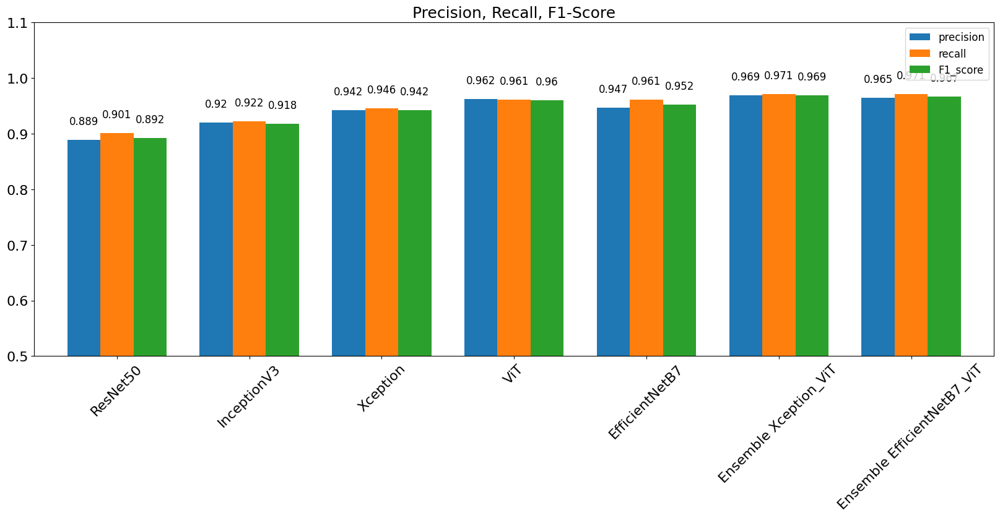

In [26]:
# on calcule les métriques F1-score, precision et recall
# et on les sauvegarde
EfficientNetB7_ViT_f1_score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
EfficientNetB7_ViT_precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
EfficientNetB7_ViT_recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)

F1_score = list(score_df['F1_score'])
precision = list(score_df['precision'])
recall = list(score_df['recall'])

F1_score.append(EfficientNetB7_ViT_f1_score)
F1_score = [round(num,3) for num in F1_score]
precision.append(EfficientNetB7_ViT_precision)
precision = [round(num,3) for num in precision]
recall.append(EfficientNetB7_ViT_recall)
recall = [round(num,3) for num in recall]
score_EfficientNetB7_ViT = { 'F1_score': F1_score, 
                            'precision': precision, 
                            'recall': recall}
score_EfficientNetB7_ViT_df = pd.DataFrame(score_EfficientNetB7_ViT,
                                           index=['ResNet50', 'InceptionV3', 'Xception', 'ViT', 
                                                  'EfficientNetB7', 'Ensemble Xception_ViT', 
                                                  'Ensemble EfficientNetB7_ViT'])
score_EfficientNetB7_ViT_df.to_csv('score_EfficientNetB7_ViT_df.csv',index=False), 
score_EfficientNetB7_ViT_df

# on visualise les performances des modèles
fontsize1 = 18
fontsize2 = 16
fontsize3 = 14
fontsize4 = 12

width = 0.25

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20,7))

barchart = score_EfficientNetB7_ViT_df.plot.bar(ax=axes, y=['precision', 'recall', 'F1_score'], 
                                                width=width*3, 
                                                rot=0, 
                                                fontsize=fontsize2)
barchart.bar_label(axes.containers[0], 
                   label_type='edge', 
                   padding=15, 
                   fontsize = fontsize4)
barchart.bar_label(axes.containers[1], 
                   label_type='edge', 
                   padding=15, 
                   fontsize = fontsize4)
barchart.bar_label(axes.containers[2], 
                   label_type='edge', 
                   padding=15, 
                   fontsize=fontsize4)
axes.set_ylim(bottom=0.5, 
              top=1.1)
axes.set_title('Precision, Recall, F1-Score', fontsize=fontsize1)
axes.set_xticklabels(['ResNet50','InceptionV3','Xception','ViT', 'EfficientNetB7', 
                      'Ensemble Xception_ViT','Ensemble EfficientNetB7_ViT'], 
                     fontsize=fontsize2,
                     rotation=45)
axes.legend(fontsize=fontsize4)

<span style="font-size:16px;white-space: pre-line">Le modèle plus performent est donc l’Ensemble Xception-Vision Transformer qui est donc sélectionné comme modèle final.<span>

In [27]:
score_EfficientNetB7_ViT_df = pd.read_csv(
    '/kaggle/input/ensemble-efficientnetb7-vit/score_EfficientNetB7 _ViT_df.csv')
score_EfficientNetB7_ViT_df.rename(index={0:'ResNet50',1:'InceptionV3',2:'Xception',3:'ViT',
                                          4:'EfficientNetB7',5:'Xception_ViT', 6:'EfficientNetB7_ViT'})

,F1_score,precision,recall
ResNet50,0.892,0.889,0.901
InceptionV3,0.918,0.920,0.922
Xception,0.942,0.942,0.946
ViT,0.960,0.962,0.961
EfficientNetB7,0.952,0.947,0.961
Xception_ViT,0.969,0.969,0.971
EfficientNetB7_ViT,0.967,0.965,0.971


# **Performance modèle final sur le jeu de validation**

In [23]:
Xception_model = define_model(tf.keras.applications.Xception)
Xception_model.load_weights('/kaggle/input/resnet50-inception-xception/Xception_model_best.h5')

IMAGE_SIZE = 512
with strategy.scope():
    pretrained_model = vit.vit_b16(
        image_size=IMAGE_SIZE,
        activation='softmax',
        pretrained=True,
        include_top=False,
        pretrained_top=False,
        classes=104)

    ViT_model = tf.keras.Sequential([
        pretrained_model,
        tf.keras.layers.Flatten(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(11, activation=tfa.activations.gelu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(104, 'softmax')], name='vision_transformer')
    
ViT_model.summary()

ViT_model.load_weights('/kaggle/input/vision-transformer/ViT_model_best.h5')

Loading and compiling model..


83689472/83683744 [==============================] - 1s 0us/step

Model: "sequential"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


xception (Functional)        (None, 16, 16, 2048)      20861480  

_________________________________________________________________

global_average_pooling2d (Gl (None, 2048)              0         

_________________________________________________________________

dense (Dense)                (None, 104)               213096    


Total params: 21,074,576

Trainable params: 21,020,048

Non-trainable params: 54,528

_________________________________________________________________


347504640/347502902 [==============================] - 16s 0us/step

Model: "vision_transformer"

_________________________________________________________________

Layer (type)                 Output Shape              Param #   


vit-b16 (Functional)   

In [24]:
IMAGE_SIZE = [512,512]
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()
cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
print('Predicting with ViT_best_model')
m1 = ViT_model.predict(images_ds)
print('Predicting with Xception_best_model')
m2 = Xception_model.predict(images_ds)

scores = []
for alpha in np.linspace(0,1,100):
    cm_probabilities = alpha*m1 + (1-alpha)*m2
    cm_predictions = np.argmax(cm_probabilities, axis=-1)
    scores.append(f1_score(cm_correct_labels, cm_predictions, 
                           labels=range(len(CLASSES)), 
                           average='macro'))

best_alpha = np.argmax(scores) / 100
cm_probabilities = best_alpha*m1 + (1-best_alpha)*m2
cm_predictions = np.argmax(cm_probabilities, axis=-1)

Predicting with ViT_best_model

Predicting with Xception_best_model


2023-02-07 19:16:16.205268: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 41945, Output num: 0

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675797376.204234071","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 41945, Output num: 0","grpc_status":3}


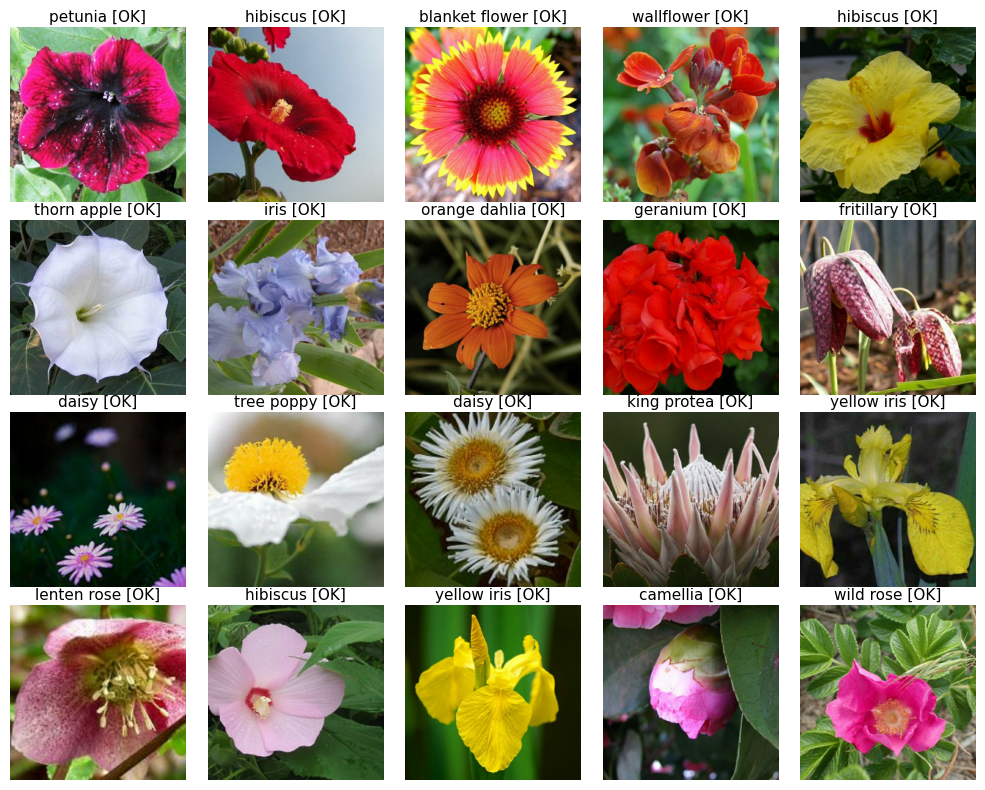

In [25]:
# validation visuelle pour un batch de 20 images
dataset = get_validation_dataset()
dataset = dataset.unbatch().batch(20)
batch = iter(dataset)
images, labels = next(batch)
probabilities = alpha*ViT_model.predict(images) + (1-alpha)*Xception_model.predict(images)
predictions = np.argmax(probabilities, axis=-1)
display_batch_of_images((images, labels), predictions)

In [26]:
# on calcule le nombre d'erreurs pour les prédictions sur le jeu de validation
mismatches = sum(cm_predictions!=cm_correct_labels)
print('Number of mismatches on validation data: {} out of {} or ({:.2%})'
      .format(mismatches, NUM_VALIDATION_IMAGES, mismatches/NUM_VALIDATION_IMAGES))

Number of mismatches on validation data: 117 out of 3712 or (3.15%)


# **Evaluations prédictions sur le jeu de test**

In [27]:
# prédictions des classes du jeu de test avec le meilleur modèle Xception-ViT
test_ds = get_test_dataset(TEST_FILENAMES, ordered=True)

print('Computing predictions...')
test_images_ds = test_ds.map(lambda image, idnum: image)
print('Predicting with ViT_best_model')
m1 = ViT_model.predict(test_images_ds)
print('Predicting with EfficientNetB7_best_model')
m2 = Xception_model.predict(test_images_ds)
probabilities = best_alpha*m1 + (1-best_alpha)*m2
predictions = np.argmax(probabilities, axis=-1)

print(predictions)

Computing predictions...

Predicting with ViT_best_model

Predicting with EfficientNetB7_best_model


2023-02-07 19:18:44.526142: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 43212, Output num: 0

Additional GRPC error information from remote target /job:worker/replica:0/task:0:

:{"created":"@1675797524.525533269","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 43212, Output num: 0","grpc_status":3}


[ 67  28  83 ... 103 102  62]


In [28]:
print('Generating submission.csv file...')

# on obtient les image ids du jeu de test
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U')

# on sauvegarde le fichier pour la participation à la competition
np.savetxt(
    'submission.csv',
    np.rec.fromarrays([test_ids, predictions]),
    fmt=['%s', '%d'],
    delimiter=',',
    header='id,label',
    comments='',
)

# on visualise les premières prédictions
!head submission.csv

Generating submission.csv file...

id,label

252d840db,67

1c4736dea,28

c37a6f3e9,83

00e4f514e,103

59d1b6146,46

8d808a07b,53

aeb67eefb,52

53cfc6586,29

aaa580243,82


<span style="font-size:16px;white-space: pre-line"> <span>